In [ ]:
# imports
import numpy as np
import matplotlib.pyplot as plt
import powerlaw
from scipy import stats
import pandas as pd
import networkx as nx
import importlib
import requests
import scipy.stats as stats
import urllib
import io
import json
import re
from collections import Counter, defaultdict
import random
import seaborn as sns
import matplotlib.colors as mcolors
from itertools import islice
import string
import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
import urllib.request
from wordcloud import WordCloud

In [ ]:
# Load the network
url = "https://raw.githubusercontent.com/denisababeii/socialgraphs_assignment2/refs/heads/denisa/network.graphml"
    
try:
    with urllib.request.urlopen(url) as response:
        data = response.read()
        
    network = nx.read_graphml(io.BytesIO(data))
    print(f"✓ Network loaded successfully!")
    print(f"  Nodes: {network.number_of_nodes()}")
    print(f"  Edges: {network.number_of_edges()}")
        
except Exception as e:
    print(f"✗ Error loading network: {str(e)}")
    network = None

✓ Network loaded successfully!
  Nodes: 484
  Edges: 7676


# **Part 1: Analyze the network**

We analyze the network of rock bands created during the previous exercises. The analysis builds on the important elements and tools introduced in exercise 5. This section is not a 1:1 mapping to the exercise. We start off by looking closer at the in and out degrees and the degree distributions.

#### **Corresponding text from Week 5 Part A exercise:**

* **Create a scatter plot, where each node is a point, and the axes show in- versus out-degree. That way you can visually inspect the patterns of how in- and out-degree are connected across all the nodes in the network. Comment on what you see.**

#### **Corresponding text from Week 5 Part B exercise:**

* **Plot a heatmap (Hint here) of the the in- versus out- degree for all characters.**

In [3]:
in_degrees = np.array(list(dict(network.in_degree).values()))
out_degrees = np.array(list(dict(network.out_degree).values()))

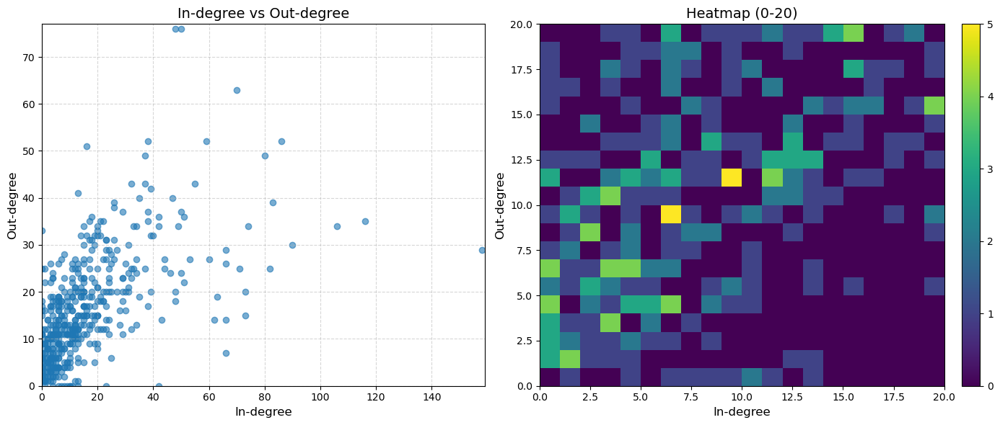

In [ ]:
# Creating the plots

fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Scatterplot
axes[0].scatter(in_degrees, out_degrees, alpha=0.6)
axes[0].set_title("In-degree vs Out-degree", fontsize=14)
axes[0].set_xlabel("In-degree", fontsize=12)
axes[0].set_ylabel("Out-degree", fontsize=12)
axes[0].grid(True, linestyle="--", alpha=0.5)
axes[0].set_xlim(0, max(in_degrees)+1)
axes[0].set_ylim(0, max(out_degrees)+1)

# Heatmap mask
mask = (in_degrees <= 20) & (out_degrees <= 20)
x = in_degrees[mask]
y = out_degrees[mask]

heatmap, xedges, yedges = np.histogram2d(x, y, bins=20, range=[[0,20],[0,20]])
extent = [xedges[0], xedges[-1], yedges[0], yedges[-1]]

im = axes[1].imshow(
    heatmap.T,
    extent=extent,
    origin='lower',
    cmap='viridis',
    interpolation='nearest',
    aspect='auto',
    vmin=0,
    vmax=heatmap.max()  # scale color to counts in 0-20 region only
)

axes[1].set_title("Heatmap (0-20)", fontsize=14)
axes[1].set_xlabel("In-degree", fontsize=12)
axes[1].set_ylabel("Out-degree", fontsize=12)
axes[1].set_xlim(0, 20)
axes[1].set_ylim(0, 20)

fig.colorbar(im, ax=axes[1], fraction=0.046, pad=0.04)

plt.tight_layout()
plt.show()


<center><sup>Figure: The left plot displays the relationship between in and out degrees. The right plot displays the relationship with a zoomed in heatmap section for the lower degrees.</sup></center>

We created two plots to see the relationship between the incoming and outgoing degrees of the nodes. We see that generally, an increase in the in-degree means an increase in the out-degree, too. Additionally, as visible on the right plot, it is the most common to have a lower number of in and out degrees. The heatmap shows us that the (somewhat) linear trend is also visible here.

We go a bit further into the examples in our network who are outliers regarding this trend: Those with high in-degree and low out-degree number, and vice versa.

#### **Corresponding text from Week 5 Part A exercise**: ####

* **Are there any nodes with high(ish) out-degree and with few incoming connections? If yes, open WikiPages of those bands/mucisians and explain what happens?**
* **Are there any nodes with high in-degree and few going connections? Again, open the WikiPages corresponding to those nodes and explain what happens?**

In [5]:
# go through all nodes and fix name encoding
decoded_names = {}
for node in network.nodes():
    decoded_name = node.encode('utf-8').decode('unicode_escape')
    decoded_names[node] = decoded_name
network = nx.relabel_nodes(network, decoded_names, copy=False)

In [6]:
in_deg_dict = dict(network.in_degree)
out_deg_dict = dict(network.out_degree)

# define percentiles for high and low degrees
high_in = np.percentile(in_degrees, 80)
low_in = np.percentile(in_degrees, 20)
high_out = np.percentile(out_degrees, 80)
low_out = np.percentile(out_degrees, 20)

In [7]:
# Identify nodes that are outside
high_in_low_out = [
    (n, in_deg_dict[n], out_deg_dict[n]) for n in network.nodes 
    if in_deg_dict[n] >= high_in and out_deg_dict[n] <= low_out
]

# do the same for low in-degree and high out-degree
low_in_high_out = [
    (n, in_deg_dict[n], out_deg_dict[n]) for n in network.nodes 
    if in_deg_dict[n] <= low_in and out_deg_dict[n] >= high_out
]

In [37]:
print("High in-degree / Low out-degree nodes:\n")
for node, in_deg, out_deg in high_in_low_out:
    print(f"Node: {node}, In-degree: {in_deg}, Out-degree: {out_deg}")

print("\nLow in-degree / High out-degree nodes:")
for node, in_deg, out_deg in low_in_high_out:
    print(f"Node: {node}, In-degree: {in_deg}, Out-degree: {out_deg}")

High in-degree / Low out-degree nodes:

Node: zz top, In-degree: 25, Out-degree: 6
Node: motörhead, In-degree: 23, Out-degree: 0
Node: mötley crüe, In-degree: 42, Out-degree: 0

Low in-degree / High out-degree nodes:
Node: alice cooper (band), In-degree: 0, Out-degree: 25
Node: marilyn manson (band), In-degree: 0, Out-degree: 33
Node: the pretty reckless, In-degree: 3, Out-degree: 26
Node: sam fender, In-degree: 1, Out-degree: 25


We can identify that there are some differences between the in and out degrees. Looking into the nodes with high in degrees and low out degrees, we can highlight those artists who were influential for others, but they themselves were not influenced or did not collaborate with the other rock bands. It is important to note that this is not entirely accurate as a model for the real world, as we can only work on the semantics provided by the Wikipedia links and connections. Still, we can identify that, for these nodes, we can typically see earlier artists who simply did not know the upcoming generation during their prime. An example is ZZ Top: when looking at their page, we can't see an 'Influences' section either that sometimes appears with other bands.

Similarly, we have examples of artists who have high out degree numbers, but low in degree. These are the ones who were less influential to others, but frequently mention/collaborate with their peers. On this side, it is more typical to have newer artists who were influenced by the previous generations but are yet to make their mark. Examples here include Sam Fender, The Pretty Reckless. As for Pretty Reckless they have a whole section for Musical style and Influences with a paragraph just referring to other artists:

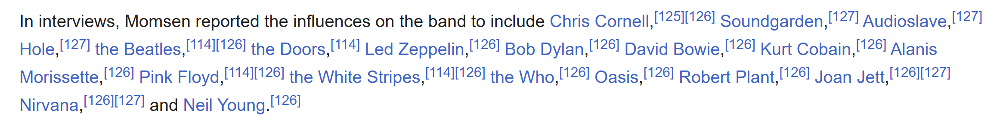

Screenshot taken from https://en.wikipedia.org/wiki/The_Pretty_Reckless#Musical_style_and_influences

Next we will continue to look at the degree distributions.

In [9]:
def degree_distribution(degrees):
    degrees = np.array(degrees)
    # Get unique degree values and their counts
    unique, counts = np.unique(degrees, return_counts=True)
    # Normalize to get probabilities P(k)
    pk = counts / len(degrees)
    return unique, pk

In [ ]:
# Get unique degree values and their counts for in-degrees
in_x, in_counts = np.unique(in_degrees, return_counts=True)
in_y = in_counts

# Get unique degree values and their counts for out-degrees
out_x, out_counts = np.unique(out_degrees, return_counts=True)
out_y = out_counts

#### **Corresponding text from Week 5 Part B exercise:**

**Plot a heatmap (Hint here) of the the in- versus out- degree for all characters.**

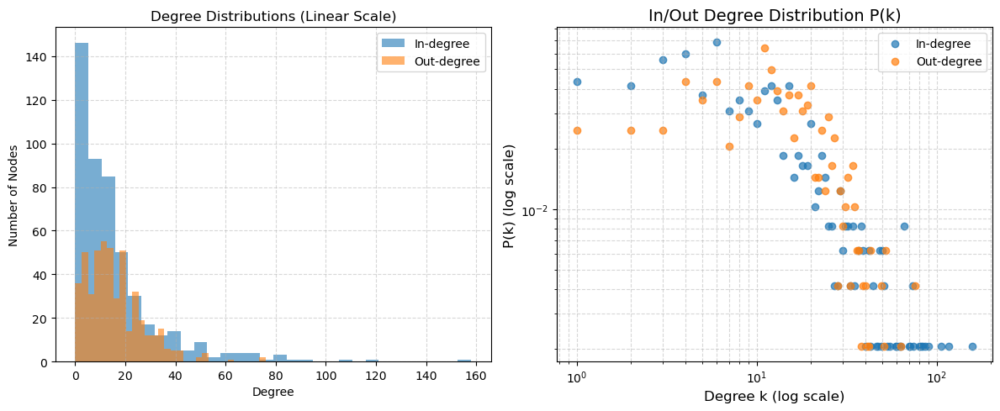

In [ ]:
# Plots
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Linear scale histograms
axes[0].hist(in_degrees, bins=30, alpha=0.6, label='In-degree')
axes[0].hist(out_degrees, bins=30, alpha=0.6, label='Out-degree')
axes[0].set_xlabel("Degree")
axes[0].set_ylabel("Number of Nodes")
axes[0].set_title("Degree Distributions (Linear Scale)")
axes[0].legend()
axes[0].grid(True, linestyle="--", alpha=0.5)


in_x, in_pk = degree_distribution(in_degrees)
out_x, out_pk = degree_distribution(out_degrees)

axes[1].scatter(in_x, in_pk, label='In-degree', alpha=0.7)
axes[1].scatter(out_x, out_pk, label='Out-degree', alpha=0.7)

# Log-log scale
axes[1].set_xscale('log')
axes[1].set_yscale('log')
axes[1].set_xlabel("Degree k (log scale)", fontsize=12)
axes[1].set_ylabel("P(k) (log scale)", fontsize=12)
axes[1].set_title("In/Out Degree Distribution P(k)", fontsize=14)
axes[1].legend()
axes[1].grid(True, which="both", linestyle="--", alpha=0.5)


plt.tight_layout()
plt.show()

<center><sup>Figure: The left plot displays the histogram of the in and out degree distributions. The right plot displays the log-log scale version (with the probabilities) on the right.

To get an initial understanding, we plot the linear and log-log distributions of our network. We observe that both the in-degree and out-degree distributions have longer tails, resembling a power-law distribution, particularly for the in-degrees. The log-log scale shows a more power-law-like drop-off, but we can observe some 'scattering' for the lower degrees, particularly in the out-degree distribution.

#### **Corresponding text from Week 5 Part B exercise:**

* **Find the degree exponent for in-, out- and total- degree distribution. Think about what you learned in the book - what does each exponent say about our network?**

In [12]:
# Calculate power-law exponents
in_degree_exponent = round(powerlaw.Fit(in_degrees, xmax=120).alpha, 2)
print("In-degree power-law exponent (alpha):", in_degree_exponent)
out_degree_exponent = round(powerlaw.Fit(out_degrees).alpha, 2)
print("Out-degree power-law exponent (alpha):", out_degree_exponent)

degrees = np.array(list(dict(network.degree).values()))
full_degree_exponent = round(powerlaw.Fit(degrees, xmax=120).alpha, 2)
print("Full-degree power-law exponent (alpha):", full_degree_exponent)

In-degree power-law exponent (alpha): 2.64
Out-degree power-law exponent (alpha): 6.01
Full-degree power-law exponent (alpha): 3.99


Values less than or equal to 0 in data. Throwing out 0 or negative values
Calculating best minimal value for power law fit
/opt/anaconda3/envs/dtu02805/lib/python3.11/site-packages/powerlaw.py:699: RuntimeWarning: invalid value encountered in divide
  (CDF_diff**2) /
Values less than or equal to 0 in data. Throwing out 0 or negative values
Calculating best minimal value for power law fit
Calculating best minimal value for power law fit
/opt/anaconda3/envs/dtu02805/lib/python3.11/site-packages/powerlaw.py:699: RuntimeWarning: divide by zero encountered in divide
  (CDF_diff**2) /


#### **Corresponding text from Week 5 Part B exercise:**

* **A long time ago, a group of scientists analyzed the network spanned by all of Wikipedia (the paper is called Wikipedias: Collaborative web-based encyclopedias as complex networks; to access this paper, use findit.dtu.dk or read the preprint on arXiv). Do your findings correspond to the results described in Chapter III.A of that paper? If not, try to give your explanation of why?**

The degree exponent for the whole network is 3.99 which indicates that the small world property is present, but the network is harder to distinguish from a random network. As also highlighted in the book (*): this network already falls into the random regime.

The book also states that the higher this degree exponent gets the less distinguishable it is from a random network. In our findings the In-degree exponent is lower compared to the out-degree exponent. This is also in line with previous research where they investigate multiple wikipedia networks and find that the the exponent is generally lower for the in than the out-degree. (**)
In our case the in-degree exponent places the network in the scale-free regime, characterized as an 'ultra-small world'.


(*) https://networksciencebook.com/chapter/4#degree-exponent

(**) https://journals.aps.org/pre/abstract/10.1103/PhysRevE.74.016115

#### **Corresponding text from Week 5 Part B exercise:**

* **We have one more metric that we have used, but not investigated so far. The node-attribute length_of_content. There are two things to look at. Firstly, we can verify that more text means more links. If that’s true the length should correlate with out-degree. Does it?**

Next we analyze if the length of the page has any correlation with the degrees. In particular, the out-degrees.

In [13]:
# for each node add a length_of_content attribute
for node, attrs in network.nodes(data=True):
    content = attrs.get("content", "")
    length_of_content = len(content)
    network.nodes[node]["length_of_content"] = length_of_content

In [39]:
# extract lengths and out-degrees
lengths = np.array([attrs["length_of_content"] for _, attrs in network.nodes(data=True)])
out_degrees = np.array(list(dict(network.out_degree).values()))

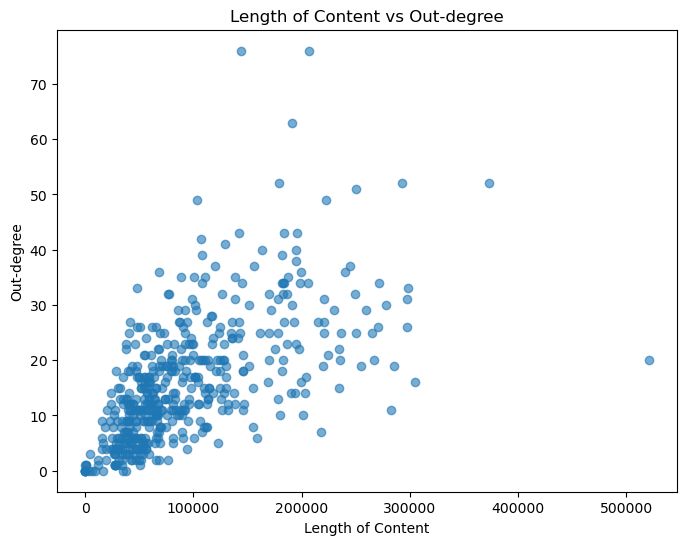

In [40]:
# Plot length of content vs out degree and vs in degree
plt.figure(figsize=(8,6))
plt.scatter(lengths, out_degrees, alpha=0.6)
plt.xlabel("Length of Content")
plt.ylabel("Out-degree")
plt.title("Length of Content vs Out-degree")
plt.show()


<center><sup>Figure: The plot displays a scatterplot of Length of Content vs Out-degree</sup></center>

The plot shows that there seems to be a direct correlation between length content and out degree, we quantify this in the following section with the help of Pearson coefficients.

#### **Corresponding text from Week 5 Part B exercise:**

* **Secondly, and more interestingly, it could be that longer texts means more famous characters. And that means more in-links.**

* **How should you test this? Well, here you are allowed to be creative. You may choose the method of your liking to study this question (e.g. look at it visually, test the correlation using spearman or pearson correlations, fit a curve to the data, you decide). Are both questions true? If yes, which phenomenon is stronger? Explain your results in your own words.**

In [ ]:
# Calculate Pearson correlation coefficients
corr_coef, p_value = stats.pearsonr(lengths, out_degrees)
print(f"Pearson correlation coefficient (out-degrees): {corr_coef:.2f}, p-value: {p_value:.2e}")

corr_coef, p_value = stats.pearsonr(lengths, in_degrees)
print(f"Pearson correlation coefficient (in-degrees): {corr_coef:.2f}, p-value: {p_value:.2e}")

Pearson correlation coefficient (out-degrees): 0.61, p-value: 2.29e-51
Pearson correlation coefficient (in-degrees): 0.04, p-value: 4.01e-01


Based on the Pearson correlation coefficients, we observe that there is a strong positive correlation ($0.61$) between the length of texts and the out-degrees. This reinforces our observation that a longer text is more likely to contain links to other artists.

However, there is almost no correlation ($0.04$) between the length of texts and the in-degrees. The data shows that there is almost no correlation between how long a Wikipedia article for a band is and how "famous" or referenced they are. This shows that more referenced bands not necessarily tend to have a more detailed Wikipedia page.

Now we analyze the network more deeply with the help of some centrality metrics.

In [17]:
# Calculate degree centrality
degree_centrality = nx.degree_centrality(network)
sorted_by_degree = sorted(degree_centrality.items(), key=lambda x: x[1], reverse=True)

# Calculate betweenness centrality
betweenness_centrality = nx.betweenness_centrality(network)
sorted_by_betweenness = sorted(betweenness_centrality.items(), key=lambda x: x[1], reverse=True)


#### **Corresponding text from Week 5 Part B exercise:**

* **Repeat Exercise 1 (plotting the network). However, this time use betweenness centrality to define the size of the node.**

We also visualize the network where the artists with higher betweenness centrality will be larger to see which are the crucial points that have a lot of shortest paths flowing through.

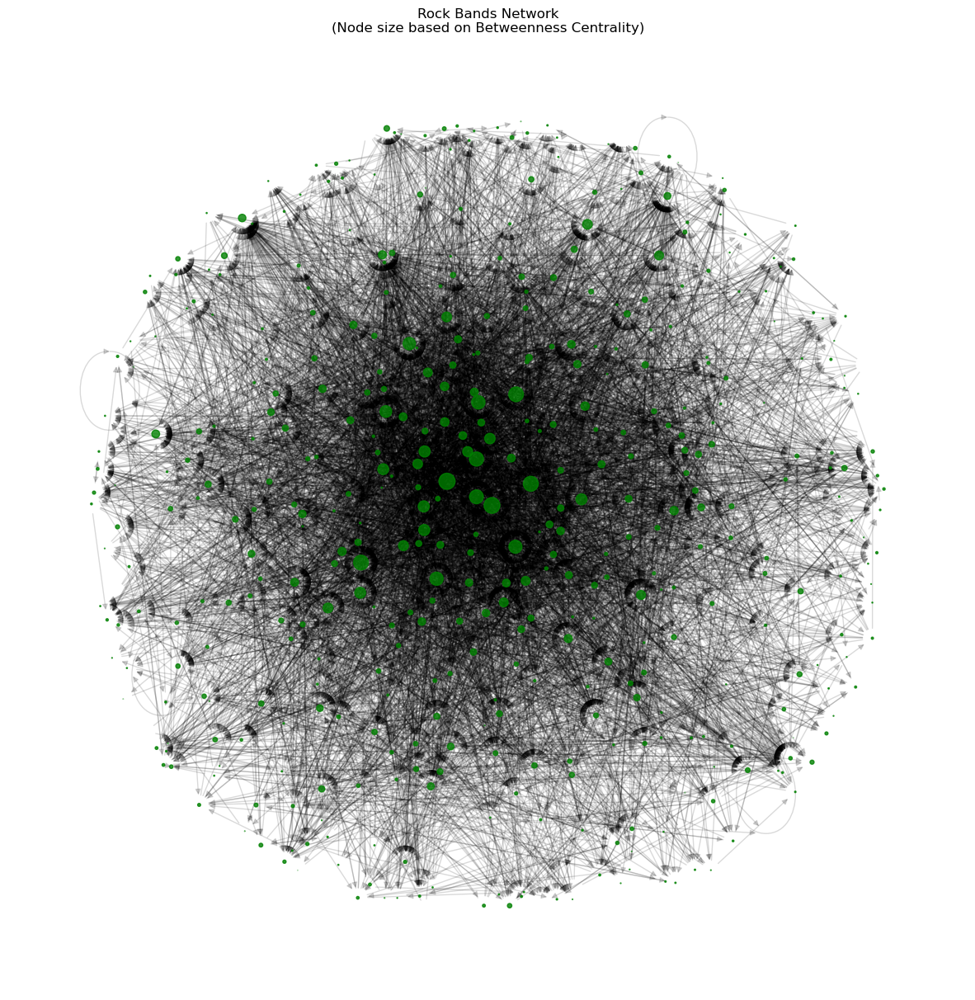

In [18]:
# Create a new figure with a larger size
plt.figure(figsize=(15, 15))

# We use the spring layout here
pos = nx.spring_layout(network, k=1, iterations=50)

# Draw nodes with size based on betweenness centrality
node_sizes = [betweenness_centrality[node] * 5000 for node in network.nodes()] 
nx.draw_networkx_nodes(network, pos, node_size=node_sizes, node_color='green', alpha=0.8)

nx.draw_networkx_edges(network, pos, alpha=0.15)

plt.title("Rock Bands Network\n(Node size based on Betweenness Centrality)")
plt.axis('off')
plt.show()

<center><sup>Figure: Visualization of the Rock Bands network where the size of the nodes is proportinal to their betweenness centrality</sup></center>

The visualization shows that we have a network-core that contains a high number of nodes with large betweenness centrality. A shortest reference path likely flows through one of the elements of these core artists when we connect two bands from e.g. the 'peripherals' of the network.

As a next step we identify who these artists are.

#### **Corresponding text from Week 5 Part B exercise:**

* **Find the 5 most central characters according to degree centrality.**
* **Find the 5 most central characters according to betweenness centrality.**

In [19]:
print("Top 5 artists by degree centrality:")
for char, centrality in sorted_by_degree[:5]:
    print(f"{char}: {centrality:.2f}")

print("\nTop 5 artists by betweenness centrality:")
for char, centrality in sorted_by_betweenness[:5]:
    print(f"{char}: {centrality:.2f}")

Top 5 artists by degree centrality:
the beatles: 0.39
led zeppelin: 0.31
the rolling stones: 0.29
queen (band)|queen: 0.29
black sabbath: 0.28

Top 5 artists by betweenness centrality:
deep purple: 0.04
queen (band)|queen: 0.04
alice in chains: 0.03
the rolling stones: 0.03
guns n' roses: 0.03


#### **Corresponding text from Week 5 Part B exercise:**

* **What role do you imagine characters with high wikipedia graph betweenness centrality play in the network?**


Looking at the results, we can observe that the network shows interesting patterns, both in degree and betweenness centrality:

Degree centrality showcases nodes that have a large amount of connections. In our network, Beatles and Led Zeppelin, and The Rolling Stones have the highest score, which shows that they indeed have a high influence in the network as famous bands.

Betweenness centrality, on the other hand, shows which bands act as bridges between other nodes (if they are part of many shortest paths in the network). Here, the top scorers are Deep Purple and Queen. Looking at the Wikipedia site of Queen, we can see that the band is active from 1970-to the present. This is an indicator that the band is a connector of different eras, too.

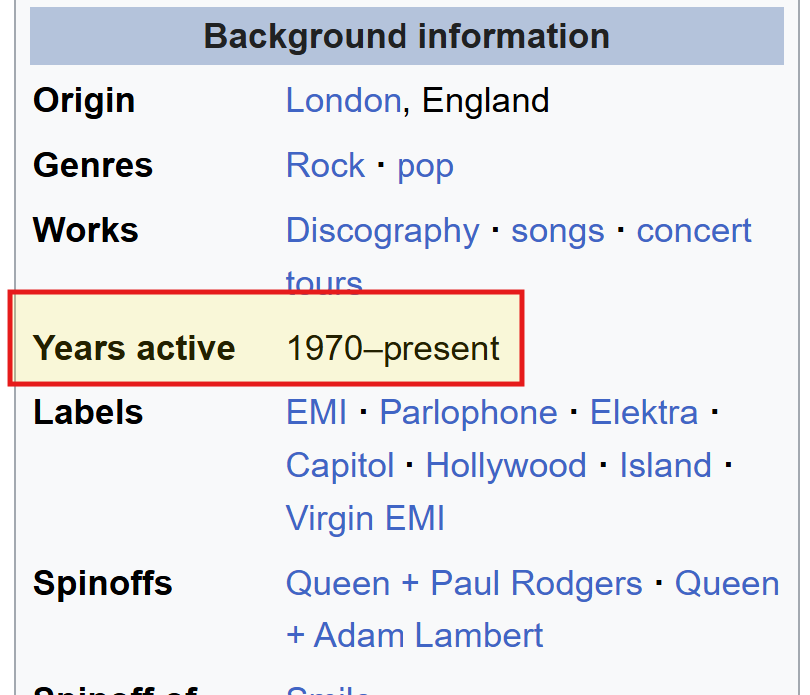

Screenshot from https://en.wikipedia.org/wiki/Queen_(band)

Similarly with Deep Purple we can also observe that they covered 2 different eras during their years active:

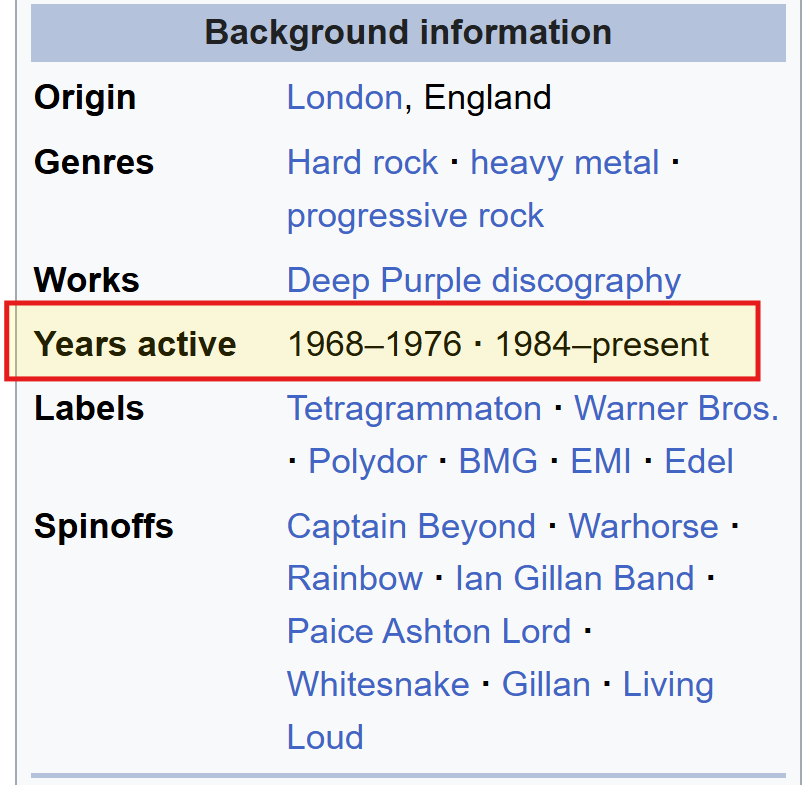

Screenshot from https://en.wikipedia.org/wiki/Deep_Purple

Additionally, their page says "They are considered to be among the pioneers of heavy metal and modern hard rock". This shows that they had influence across multiple genres. This aligns with our findings regarding their centrailty.



#### **Corresponding text from Week 5 Part B exercise:**

* **Find the 5 most central characters according to eigenvector centrality. Calculate centrality corresponding to both in- and out-edges (see NetworkX documentation for details).**

Next we will look at another bit more sophisticated measure, which is the eigenvector-centrality. Compared to degree centrality, this metric also takes into account how important are the neighbors of a given node.

In [20]:
# eigen_in computes centrality on the reversed graph

eigen_out = nx.eigenvector_centrality(network, max_iter=2000)
eigen_in = nx.eigenvector_centrality(network.reverse(), max_iter=2000)

In [21]:
# sort and print top 5 for each
sorted_eig_out = sorted(eigen_out.items(), key=lambda x: x[1], reverse=True)
sorted_eig_in = sorted(eigen_in.items(), key=lambda x: x[1], reverse=True)

print("Top 5 by eigenvector centrality (out-edges / normal adjacency):")
for n, v in sorted_eig_out[:5]:
    print(f"{n}: {v:.2f}")

print("\nTop 5 by eigenvector centrality (in-edges / reversed adjacency):")
for n, v in sorted_eig_in[:5]:
    print(f"{n}: {v:.2f}")

Top 5 by eigenvector centrality (out-edges / normal adjacency):
the beatles: 0.27
led zeppelin: 0.20
the rolling stones: 0.19
the who: 0.17
bob dylan: 0.17

Top 5 by eigenvector centrality (in-edges / reversed adjacency):
alice in chains: 0.20
deep purple: 0.17
black sabbath: 0.17
metallica: 0.16
megadeth: 0.14


We compare the degree centrality with the eigenvector centrality to see if a higher degree also means a greater overall importance within the network. We already see among the out-eigenvector lists's top 5 members that the top 3 are the same as for the degree centrality.

We quantify this with measuring correlation.

#### **Corresponding text from Week 5 Part B exercise:**

* **Repeat the scatter plot using eigenvector centrality instead of betweenness centrality. Do you observe any difference relative to above? Why?**

In [22]:
# extract data for plotting
nodes = list(network.nodes())
deg = np.array([degree_centrality[n] for n in nodes])
bet = np.array([betweenness_centrality[n] for n in nodes])
eig = np.array([eigen_out[n] for n in nodes])
eig_i = np.array([eigen_in[n] for n in nodes])

In [23]:
# Compute Pearson correlations
r_eig_deg, p_eig_deg = stats.pearsonr(deg, eig)
r_in, p_in = stats.pearsonr(deg, eig_i)
print(f"Pearson correlation (Degree vs Eigen Out): r={r_eig_deg:.4f}, p={p_eig_deg:.4e}")
print(f"Pearson correlation (Degree vs Eigen In): r={r_in:.4f}, p={p_in:.4e}")

Pearson correlation (Degree vs Eigen Out): r=0.9070, p=3.6038e-183
Pearson correlation (Degree vs Eigen In): r=0.7293, p=1.7356e-81


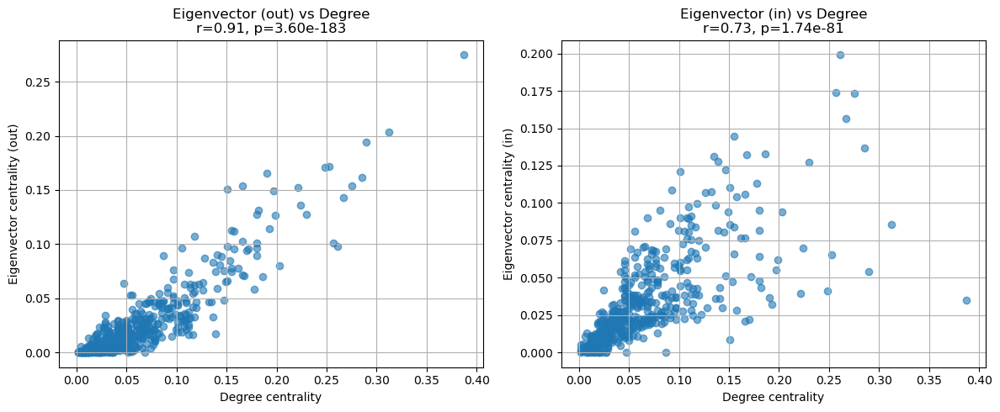

In [24]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Scatterplots
axes[0].scatter(deg, eig, alpha=0.6)
axes[0].set_xlabel("Degree centrality")
axes[0].set_ylabel("Eigenvector centrality (out)")
axes[0].set_title(f"Eigenvector (out) vs Degree\nr={r_eig_deg:.2f}, p={p_eig_deg:.2e}")
axes[0].grid(True)

axes[1].scatter(deg, eig_i, alpha=0.6)
axes[1].set_xlabel("Degree centrality")
axes[1].set_ylabel("Eigenvector centrality (in)")
axes[1].set_title(f"Eigenvector (in) vs Degree\nr={r_in:.2f}, p={p_in:.2e}")
axes[1].grid(True)

plt.tight_layout()
plt.show()


<center><sup>Figure: The left plot displays the scatterplots of the eigenvector out centralities vs the degree centrality. The right plot displays the scatterplots of the eigenvector in centralities vs the degree centrality.</sup></center>

Based on the plot and the correlation metric, we see that degree and out eigenvector centrality is highly correlated for this network. This means that bands that have more connections tend to also be connected to more important nodes. (E.g. Beatles and Rolling Stones from the previous findings)

We also observe a slightly weaker correlation when we compare the eigenvector centrality for the in degrees with the degree centrality. This means that those nodes being referenced by popular nodes also tend to have higher degree.
These findings bring up the question of the network possibly being assortative, which we look into next.



#### **Corresponding text from Week 5 Part B exercise:**

* **Is the undirected version of the graph assortative with respect to degree? (e.g. do high-degree characters tend to link to other high-degree characters, and low-degree characters to other low-degree characters?). Provide an interpretation of your answer.**

* **Is the undirected version of the graph assortative with respect do the length_of_content nodal properties? (e.g. do characters with long Wikipedia pages tend to link to other charakters with long Wiki-pages, and vice versa?.**

Assortativity measures the tendency of nodes to connect to other nodes that are similar to them in some property. We investigate this tendency with the degrees and the length of content. We will use an undirected version of the graph for this.

In [25]:
# Convert to undirected graph for assortativity
undirected = network.to_undirected()

degree_assortativity = nx.degree_assortativity_coefficient(undirected)
print(f"Degree assortativity coefficient: {degree_assortativity:.2f}")

content_assortativity = nx.attribute_assortativity_coefficient(undirected, 'length_of_content')
print(f"\nLength of content assortativity coefficient: {content_assortativity:.2f}")

Degree assortativity coefficient: -0.01

Length of content assortativity coefficient: -0.00


In [26]:
# Visualize degree correlations
degrees = np.array([d for n, d in undirected.degree()])
neighbor_degrees = []
for node in undirected.nodes():
    # Get degrees of all neighbors
    nbr_deg = np.mean([undirected.degree(nbr) for nbr in undirected.neighbors(node)])
    neighbor_degrees.append(nbr_deg)
neighbor_degrees = np.array(neighbor_degrees)

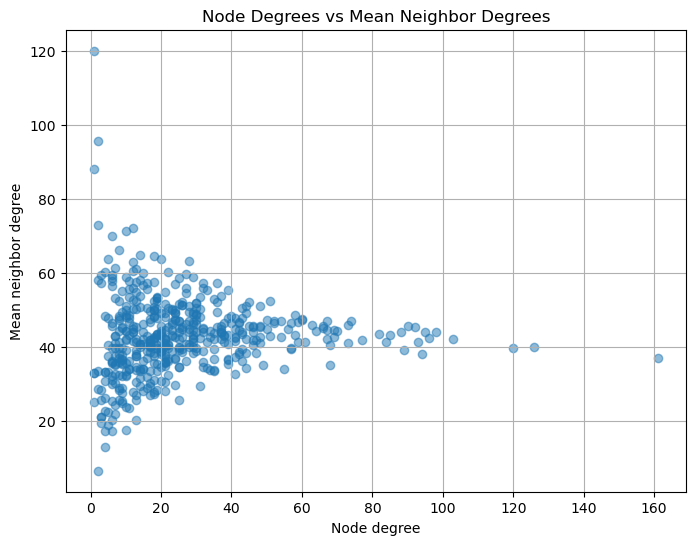

In [27]:
# Scatter plot of node degree vs mean neighbor degree
plt.figure(figsize=(8, 6))
plt.scatter(degrees, neighbor_degrees, alpha=0.5)
plt.xlabel("Node degree")
plt.ylabel("Mean neighbor degree")
plt.title("Node Degrees vs Mean Neighbor Degrees")
plt.grid(True)
plt.show()

<center><sup>Figure: The plot displays the scatterplot of node degrees vs the means of their neighbors' degrees.</sup></center>

The degree assortativity is $-0.01$, which shows that there is no tendency of high degree artists linking to eachother (and low degree ones to eachother), which contradicts our assumptions.

The plot above illustrates this observation, as it is clearly visible that even though for the low degree nodes there is a larger spread, the mean neighbor degrees stay at around 40, without showing a tendency to increase with the node degree.

We also calculated the assortativity for the length of content, which is near zero. This also shows no tendency for longer pages linking to other longer pages. This is an important finding, with the fact in mind that we have already seen that the longer a page is, the more connections it tends to have.

Both of these findings suggest that connections are more based on relevance for the articles than popularity. This means that the connections are more "democratic" for the rock band network.

As a concluding step we created a visualization of the network, using a backbone to make the structure more visible.

#### **Corresponding text from Week 5 Part C exercise:**

* **Extract the network backbone for both Weighted Network 1, 2, and 3. You can implement the disparity filter yourself based on the scientific paper or find an implentation on GitHub (there are several ones to choose from … I like this implementation, which also includes other interesting edge filters). Figure out how your particular backbone extractor works (you may have to inspect the code itself, these packages are not always well documented). Play around with values of to get an aestetically pleasing visualization (but don’t make the resulting network too sparse).**

For this assignment, we will only be working on the undirected Rock Music Network with edge weights proportional to the edge betweenness centrality. The betweenness centrality will be renormalized so that the lowest weight is equal to 1 and the highest weight is equal to 100.

In [28]:
# We work with the undirected version of the full graph
undirected_full = network.to_undirected()
# Extract giant connected component
components = list(nx.connected_components(undirected_full))
largest_cc = max(components, key=len)
Gcc = undirected_full.subgraph(largest_cc).copy()
print(f"GCC nodes: {Gcc.number_of_nodes()}, edges: {Gcc.number_of_edges()}")

GCC nodes: 484, edges: 6301


We use weights that are proportional to the edge betweenness centrality.

In [29]:
# Compute edge betweenness and renormalize to [1,100]
ebc = nx.edge_betweenness_centrality(Gcc, normalized=True)
vals = np.array(list(ebc.values()))

# Renormalization
minv, maxv = float(vals.min()), float(vals.max())
if maxv > minv:
    renorm_w = {e: 1 + (v - minv) * (99.0 / (maxv - minv)) for e, v in ebc.items()}
else:
    renorm_w = {e: 1.0 for e in ebc}

In [30]:
# Assign weights
for (u, v), w in renorm_w.items():
    if Gcc.has_edge(u, v):
        Gcc[u][v]['weight'] = w

We use the solution of Michele Coscia for the disparity filter with a very few minor tweaks.
https://www.michelecoscia.com/?page_id=287
This script is imported from our github.

In [31]:
# Disparity filter helper script
helper_script_link = "https://raw.githubusercontent.com/denisababeii/socialgraphs_assignment2/refs/heads/botond/disparity_filter_helper.py"
spec = importlib.util.spec_from_loader("helper", loader=None)
helper = importlib.util.module_from_spec(spec)
exec(requests.get(helper_script_link).text, helper.__dict__)

In [32]:
# Create edge table from Gcc
rows = []
for u, v, data in Gcc.edges(data=True):
    w = float(data.get('weight', 1.0))
    rows.append({'src': u, 'trg': v, 'nij': w})
    # duplicate for undirected edges
    rows.append({'src': v, 'trg': u, 'nij': w})

table = pd.DataFrame(rows)

# Ensure types for pandas >=2.0 compatibility
table['nij'] = table['nij'].astype(float)
table['src'] = table['src'].astype(str)
table['trg'] = table['trg'].astype(str)

In [33]:
# Apply disparity filter
df_table = helper.disparity_filter(
    table.copy(),
    undirected=True,
    return_self_loops=False
)

# Apply thresholding
alpha = 0.77
thr_table = helper.thresholding(df_table, alpha)

Calculating DF score...


In [34]:
# Build networkx graph for backbone
G_b = nx.Graph()
G_b.add_nodes_from(Gcc.nodes(data=True))

In [35]:
# Add edges from thresholded table
for _, row in thr_table.iterrows():
    s = row['src']
    t = row['trg']
    score = row.get('score', None)
    if Gcc.has_edge(s, t):
        w = Gcc[s][t].get('weight', 1.0)
        G_b.add_edge(s, t, weight=w, score=score)

# Remove isolated ones
G_b = G_b.subgraph([n for n in G_b.nodes() if G_b.degree(n) > 0]).copy()
backbones_coscia = G_b
print(f"coscia alpha={alpha}: nodes={G_b.number_of_nodes()}, edges={G_b.number_of_edges()}")


coscia alpha=0.77: nodes=483, edges=1276


We found an alpha threshold of 0.77 to work the best for providing a structural overview, but still comprehendable. We use the forceatlas layout for the visualization.

#### **Corresponding text from Week 5 Part C exercise:**

* **Plot the resulting three networks using ForceAtlas2, still sizing nodes according to total degree. No need to color them. If your backbone has some disconnected nodes, feel free to not plot them. And remember to calculate a new layout to see how the structure has changed.**

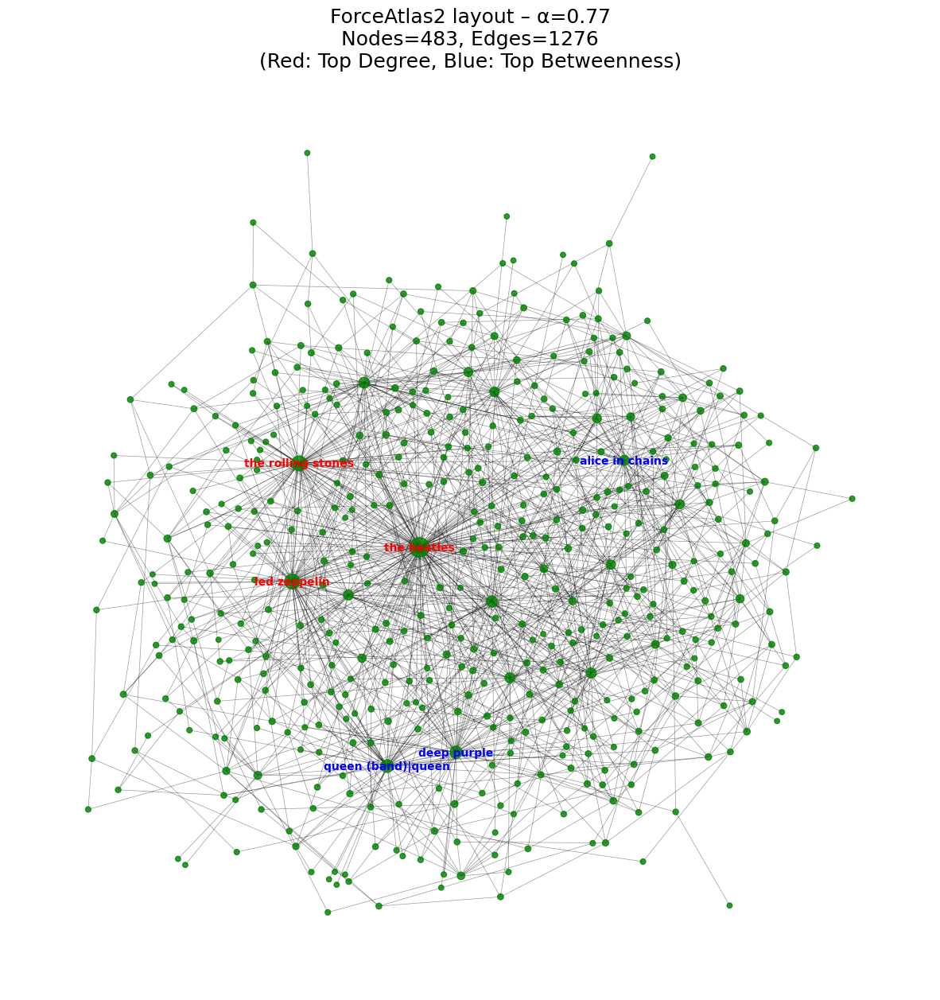

In [36]:
import networkx as nx
import matplotlib.pyplot as plt

G_b_plot = G_b.copy()
isolates = list(nx.isolates(G_b_plot))
G_b_plot.remove_nodes_from(isolates)

pos = nx.forceatlas2_layout(G_b_plot, max_iter=200, gravity=0.5)

# Node sizes proportional to degree
degrees = dict(G_b_plot.degree())
sizes = [20 + 2 * degrees[n] for n in G_b_plot.nodes()]

plt.figure(figsize=(15, 15))
nx.draw_networkx_nodes(G_b_plot, pos, node_size=sizes, node_color="green", alpha=0.8)
nx.draw_networkx_edges(G_b_plot, pos, alpha=0.4, width=0.5)

# Annotate top 3 nodes by degree
top_nodes = sorted(degrees.items(), key=lambda x: x[1], reverse=True)[:3]
for node, deg in top_nodes:
    x, y = pos[node]
    plt.text(x, y, str(node), fontsize=10, fontweight='bold', color='red',
             horizontalalignment='center', verticalalignment='center')
    
# Annotate top 3 nodes by betweenness centrality
top_nodes_betweenness = [node for node, _ in sorted_by_betweenness[:3]]
for node in top_nodes_betweenness:
    if node in pos:
        x, y = pos[node]
        plt.text(x, y - 0.03, str(node), fontsize=10, fontweight='bold', color='blue',
                 horizontalalignment='center', verticalalignment='center')

plt.title(f"ForceAtlas2 layout – α={alpha}\nNodes={G_b_plot.number_of_nodes()}, Edges={G_b_plot.number_of_edges()}\n(Red: Top Degree, Blue: Top Betweenness)", fontsize=18)
plt.axis("off")
plt.show()


Plot: Network backbone visualization with the node sizes being proportional to the degree. The top 3 artists according to degree centrality are annotated with red, the ones according to betweenness centrality are markedd with blue.

#### **Corresponding text from Week 5 exercise:**

* **Do you see any structures in the networks now? Inspect some nodes to get a sense of what the structures captures in the three networks. Describe your findings in your own words.**

We see the structure more clearly with the backbone visualization. The nodes with the top number of degrees (also present in our previous analysis steps) were also annotated. The structure shows that there are a few hubs that stand out compared to the rest of the network, the ones annotated by red being the top candidates for degree centrality.

The top candidates for betweenness centrality are also annotated with blue. Their gateway role is also observable, especially with Queen, as the size is not as large as the other hubs, but it has links from multiple directions with a lot of artists that are further away in the layout. This enables the band to be a critical point for multiple shortest paths within the network.

# **Part 2: Genres and communities and plotting**

### **Write about genres and modularity.**

##### **Corresponding text from Week 7 Part 2 exercise:** ##### 
**Go nuts with an LLM and get all the genres for the nodes in your network**

**Yes, I'm serious. For this one I'd like you to fire up your most powerful thinking model you have access to and get it to write a script to extract genre for all nodes in your network. Some notes to help you**
* **If the node doesn't have an infobox (or if a node's infobox doesn't have a genre it it), just don't assign that node a genre and ignore it in the downstream analysis**
* **Remember to lowercase all genres, also consider simplifying things by mapping rock'n'roll, rock & roll, etc to a single genre.**
* **Remember to test your algorithm well before emplying it, since you're not writing the code yourself, you need to work harder to prove to yourself that it's actually doing what you think it's doing. You should inspect the code to understand what it's actually doing and also test it on the strangest edge-cases you can find. (Can it handle, "The Animals", for example).**
* **The output should be a dictionary mapping artist names to lists of genres (since most artists have multiple genres listed).**

In order to extract the genre information from all the artists pages, I started by loading the network from Github. Each node contains the name of the artist and its corresponding page content.

I converted the directed graph to undirected (as required by *Note: For this and the next exercise, work on the undirected version of the network.*).

In [374]:
network = network.to_undirected()

With the help of an LLM, I defined a function to extract the genre information from each page.

In [375]:
# Helper function to clean the genre text
def clean_genre(genre):
    # Remove reference tags like <ref>...</ref>
    genre = re.sub(r'<ref[^>]*>.*?</ref>', '', genre, flags=re.DOTALL)
    # Remove {{nowrap|...}}
    genre = re.sub(r'\{\{nowrap\|(.*?)\}\}', r'\1', genre)
    # Remove any remaining {{ }}
    genre = re.sub(r'\{\{[^}]*\}\}', '', genre)
    # Remove brackets
    genre = re.sub(r'[\[\]]', '', genre)
    # Clean whitespace
    genre = ' '.join(genre.split())
    # Change to lowercase
    genre = genre.lower().strip()
    
    # Map various rock variants to single genre
    rock_variants = {
        "rock'n'roll": "rock and roll",
        "rock & roll": "rock and roll",
        "rock 'n' roll": "rock and roll",
        "rock n roll": "rock and roll",
        "rock-and-roll": "rock and roll"
    }
    
    if genre in rock_variants:
        return rock_variants[genre]
    
    return genre

# Extract genres list from the wikipedia pages
def extract_genres(content):
    # Parse the JSON structure
    data = json.loads(content)
    
    # Navigate to the wikitext content
    pages = data.get('query', {}).get('pages', {})
    if not pages:
        return []
    
    # Get the page
    page_id = list(pages.keys())[0]
    wikitext = pages[page_id].get('revisions', [{}])[0].get('slots', {}).get('main', {}).get('*', '')
    
    if not wikitext:
        return []
    
    # Extract the Infobox musical artist section
    infobox_pattern = r'\{\{Infobox musical artist(.*?)\n\}\}'
    infobox_match = re.search(infobox_pattern, wikitext, re.DOTALL | re.IGNORECASE)
    
    if not infobox_match:
        return []
    
    infobox_content = infobox_match.group(1)
    
    # Extract genre field
    # Look for | genre = followed by content until the next | field
    genre_pattern = r'\|\s*genre\s*=\s*(.*?)(?=\n\||\n\}\})'
    genre_match = re.search(genre_pattern, infobox_content, re.DOTALL | re.IGNORECASE)
    
    if not genre_match:
        return []

    genre_content = genre_match.group(1).strip()
    
    # Parse genres - they can be in various formats
    genres = []
    
    # Remove {{flatlist| and }} wrappers
    genre_content = re.sub(r'\{\{flatlist\|', '', genre_content, flags=re.IGNORECASE)
    genre_content = re.sub(r'\}\}', '', genre_content)
    
    # Remove wiki formatting like [[Genre]] or [[Genre|display text]]
    # Pattern: [[link]] or [[link|text]]
    wiki_links = re.findall(r'\[\[([^\]|]+)(?:\|[^\]]+)?\]\]', genre_content)
    
    if wiki_links:
        # If we found wiki links, use those
        genres = wiki_links
    else:
        # Otherwise, split by common separators
        # Remove any remaining markup
        genre_content = re.sub(r'<[^>]+>', '', genre_content)
        genre_content = re.sub(r'\*\s*', '', genre_content)
        
        # Split by newlines, commas or bullets
        genre_list = re.split(r'[\n,•]', genre_content)
        genres = [g.strip() for g in genre_list if g.strip()]
    
    # Clean genres
    cleaned_genres = []
    for genre in genres:
        if genre:
            cleaned_genre = clean_genre(genre)
            if cleaned_genre != 'allmusic': # Remove allmusic (discovered during testing)
                cleaned_genres.append(cleaned_genre)
    
    return cleaned_genres

I extracted the genres from each node and added them as a node attribute.

In [376]:
artist_genres = []

for n in network.nodes():
    # Add genres as a list attribute
    genres = extract_genres(network.nodes[n]['content'])
    artist_genres.append(genres)
    network.nodes[n]['genres'] = genres

##### **Corresponding text from Week 7 Part 2 exercise:** ##### 

**Report the following stats**
* **The number of nodes for which you could find genres**
* **The average number of genres per node**
* **The total number of distinct genres**
* **A histogram showing artist counts for the top 15 genres**

With the help of an LLM, I created a function that generates the above statistics for genres.

In [377]:
# Generate statistics for the nodes with genres
def generate_statistics(nodes_with_genres):
    # 1. Number of nodes with genres
    num_artists_with_genres = len(nodes_with_genres)
    print(f"\n1. Number of artists with genres: {num_artists_with_genres}")
    
    # 2. Average number of genres per node
    total_genres = sum(len(network.nodes[node]['genres']) for node in nodes_with_genres)
    avg_genres = total_genres / num_artists_with_genres if num_artists_with_genres > 0 else 0
    print(f"2. Average number of genres per artist: {avg_genres:.2f}")
    
    # 3. Total number of distinct genres
    all_genres = set()
    for node in nodes_with_genres:
        genres = network.nodes[node]['genres']
        all_genres.update(genres)
    num_distinct_genres = len(all_genres)
    print(f"3. Total number of distinct genres: {num_distinct_genres}")
    
    # 4. Top 15 genres histogram
    genre_counter = Counter()
    for node in nodes_with_genres:
        genres = network.nodes[node]['genres']
        genre_counter.update(genres)
    
    top_15 = genre_counter.most_common(15)
    
    print(f"\n4. Top 15 genres:")
    for i, (genre, count) in enumerate(top_15, 1):
        print(f"   {i:2d}. {genre:30s} - {count:3d} artists")
    
    # Create histogram
    if top_15:
        genres_list, counts = zip(*top_15)
        
        plt.figure(figsize=(14, 8))
        bars = plt.barh(range(len(genres_list)), counts, color='steelblue')
        plt.yticks(range(len(genres_list)), genres_list)
        plt.xlabel('Number of Artists', fontsize=12)
        plt.ylabel('Genre', fontsize=12)
        plt.title('Top 15 Genres by Artist Count', fontsize=14, fontweight='bold')
        plt.gca().invert_yaxis()  # Highest at top
        
        # Add count labels on bars
        for i, (bar, count) in enumerate(zip(bars, counts)):
            plt.text(count + 0.5, i, str(count), va='center', fontsize=10)
        
        plt.tight_layout()
        plt.show()
    
    return {
        'num_artists_with_genres': num_artists_with_genres,
        'avg_genres_per_artist': avg_genres,
        'num_distinct_genres': num_distinct_genres,
        'top_15_genres': top_15
    }

I generate statistics for the nodes which I have extracted genres from.


1. Number of artists with genres: 148
2. Average number of genres per artist: 3.72
3. Total number of distinct genres: 144

4. Top 15 genres:
    1. hard rock                      -  33 artists
    2. rock music                     -  32 artists
    3. pop rock                       -  29 artists
    4. alternative rock               -  24 artists
    5. pop music                      -  22 artists
    6. blues rock                     -  22 artists
    7. soft rock                      -  20 artists
    8. folk rock                      -  14 artists
    9. art rock                       -  13 artists
   10. heavy metal music              -  13 artists
   11. rock and roll                  -  13 artists
   12. country rock                   -  12 artists
   13. southern rock                  -  11 artists
   14. indie rock                     -   9 artists
   15. new wave music                 -   9 artists


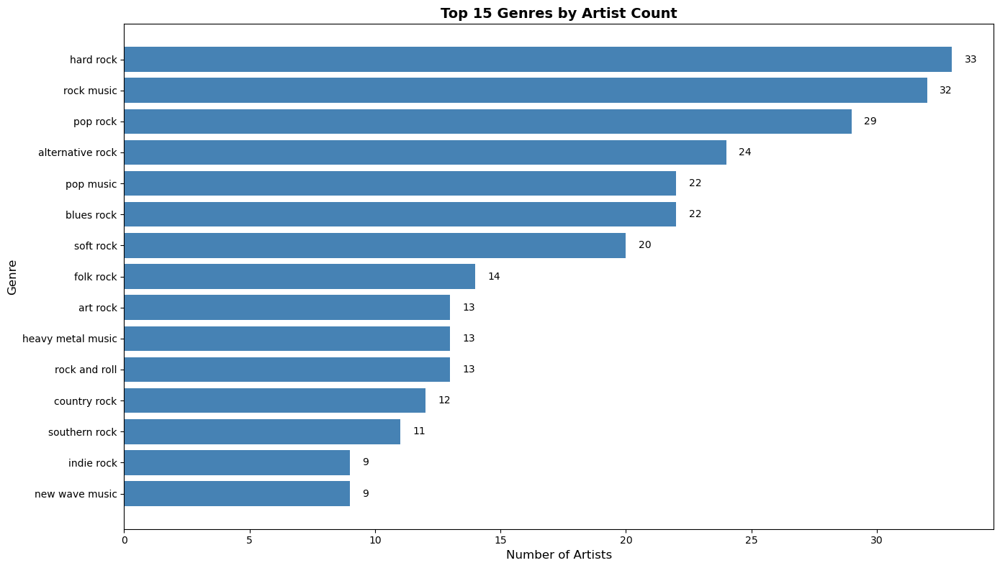

In [378]:
nodes_with_genres = [n for n in network.nodes() if network.nodes[n]['genres']]
stats = generate_statistics(nodes_with_genres)

<center><sup>Figure: Top 15 genres by artist count</sup></center>

As expected, the genres are mostly subsets of the rock genre. It can also be observed that Wikipedia considers subgenres of rock but also the broad genres like 'rock music' or 'pop music' when defining the artists. Also an interesting mention is that 'pop music' also appears in the list, so a lot of the artists are actually blending rock and pop music.

##### **Corresponding text from Week 7 Part 2 exercise:** ##### 

**Explain the concept of modularity in your own words.**

Summarising in my own words what the [Network Science book - Section 9.4](https://networksciencebook.com/chapter/9#modularity) describes, modularity is a measure of a partition's quality, helping to decide if a community partition is better than another one. Modularity optimization is important in community detection algorithms, such as the Louvain algorithm.

Modularity $Q$ is represented by the equation:

$Q = \sum_{c} \left[ \frac{l_c}{L} - \left( \frac{d_c}{2L} \right)^2 \right]$

Where $l_c$ is the number of links inside community ${C_c}$, $L$ is the total number of links in the network, and $d_c$ is the sum of the degrees of the nodes in community ${C_c}$.,

The higher is a partition's modularity, the better is the structure of the community it describes. In the case of taking the whole network as on single community, this means that $L_c = L$ and $d_c = 2L$, leading to a modularity of $Q = 0$. On the other case, if each node is its own community, then $L_c = 0$ will only leave the negative terms, resulting a negative modularity.

Overall, the idea behind modularity's computation is that if there are more links inside a community than you’d expect by chance, then those nodes probably form a real community.

For computing modularity, I continue to work with a subnetwork of nodes containing genre information (As required by *Work from the undirected version of the network, keeping only the nodes for which you have genre information.*).

In [379]:
subnetwork = network.subgraph(nodes_with_genres)

### **Detect the communities, discuss the value of modularity in comparison to the genres.**

##### **Corresponding text from Week 7 Part 2 exercise:**

**Now create your own partition of the network into genres.**
* **Each node is simply characterized by the first genre in its list of genres.**
* **Each community is the group of nodes that share the same genre.**
* **That's all you need, now calculate the modularity of this division of the network into genres.**
* **Note: Modularity is described in the Network Science book, section 9.4.. Thus, use equation 9.12 in the book to calculate the modularity M of the partition described above. Are the genres good communities?**
**Thinking a bit about the underlying data, a potential issue is the following: Many artists have the genre rock as their first genre in the list (since we started from a list of rock bands). So if rock is a big community, the network won't have very high modularity.**

I first created a partition where each node is characterized by the first genre in its list of genres. Each community is the group of nodes that share the same genre.

In [380]:
# Create a partition based on the first genre in the node's list of genres
def create_first_genre_partition(G):
    labels = {}
    
    for node in G.nodes():
        genres = G.nodes[node]['genres']
        if genres:
            labels[node] = genres[0]
    
    # Create communities based on the assigned genres
    communities = defaultdict(list)
    for node, community in labels.items():
        communities[community].append(node)
    return communities


first_partition = create_first_genre_partition(subnetwork)
# Print the first 3 results
print("First 3 communities based on first genre partition and some of their members:\n")
for key, members in islice(first_partition.items(), 3):
    print(f"{key} ({len(members)} members):")
    for m in members[:3]:
        print(f"  - {m}")
    print()

First 3 communities based on first genre partition and some of their members:

progressive rock (4 members):
  - the alan parsons project
  - the moody blues
  - peter gabriel

rock music (29 members):
  - eddie money
  - neil young
  - roy orbison

folk rock (4 members):
  - donovan
  - the lovin' spoonful
  - the byrds



I defined a function to compute modularity based on the equation $Q = \sum_{c} \left[ \frac{l_c}{L} - \left( \frac{d_c}{2L} \right)^2 \right]$ 9.12 from the [Network Science book - Section 9.4](https://networksciencebook.com/chapter/9#modularity:~:text=Section%209.4-,Modularity,-In%20a%20randomly). The modularity is returned with a 2 decimal point precision.

In [381]:
# Compute modularity based on the equation
def calculate_modularity(G, partition):
    # Get total number of edges
    L = G.number_of_edges()
    
    # Calculate modularity
    modularity = 0.0
    
    for community, nodes in partition.items():
        # Calculate lc: number of edges inside this community
        lc = 0
        for i, node_i in enumerate(nodes):
            for node_j in nodes[i+1:]:  # Only check pairs once
                if G.has_edge(node_i, node_j):
                    lc += 1
        
        # Calculate dc: sum of degrees of all nodes in this community
        dc = sum(G.degree(node) for node in nodes)
        
        # Add contribution of this community to modularity
        # Q = Σc [lc/L - (dc/2L)²]
        modularity += (lc / L) - (dc / (2 * L)) ** 2
    
    return round(modularity, 2)

The partition created leads to a slightly higher than 0 modularity, so the option of defining communities by the first genre in the list is suboptimal.

In [382]:
print(calculate_modularity(subnetwork, first_partition))

0.05


##### **Corresponding text from Week 7 exercise:** ##### 

* **What happens to the modularity if you use a random genre from the list genre as the node-label for those nodes with more than one genre listed?**

I continued by checking the modularity obtained for a partition defined by a random genre in the node's list of genres.

In [383]:
# Create a partition based on a random genre from the list
def create_genre_random_partition(G):
    labels = {}
    
    for node in G.nodes():
        genres = G.nodes[node]['genres']
        if genres:
            labels[node] = random.choice(genres)
    
    # Create communities based on the assigned genres
    communities = defaultdict(list)
    for node, community in labels.items():
        communities[community].append(node)
    return communities


ranodm_partition = create_genre_random_partition(subnetwork)

# Print the first 3 results
print("First 3 communities based on random genre partition and some of their members:\n")
for key, members in islice(ranodm_partition.items(), 3):
    print(f"{key} ({len(members)} members):")
    for m in members[:3]:
        print(f"  - {m}")
    print()

First 3 communities based on random genre partition and some of their members:

art rock (4 members):
  - the alan parsons project
  - bryan ferry
  - peter gabriel

rock music (17 members):
  - eddie money
  - neil young
  - roy orbison

psychedelic music (3 members):
  - donovan
  - the byrds
  - jimi hendrix



As expected, the modularity of the random partition is closer to 0, so it is worse than choosing the first genre from the genre list as a way to define communities. When running multiple times, the modularity has varied from low values to negative values.

In [384]:
print(calculate_modularity(subnetwork, ranodm_partition))

0.03


##### **Corresponding text from Week 7 Part 2 exercise:** #####
* **Discuss your findings - and decide how you want to settle on a single genre for each band.**

I tested also with the second genre in the list, since I had the assumption that the genres will be slightly less broad but still accurately defining the artist's style. However, on computing the modularity the first genre approach had the highest value. This is because using the second genre splits the communities, resulting in more communities with just 1 or 2 members.

In [385]:
# Create a partition based on the second genre in the node's list of genres
def create_second_genre_partition(G):
    labels = {}
    
    for node in G.nodes():
        genres = G.nodes[node]['genres']
        if len(genres)>1:
            # Set the label as the second genre
            labels[node] = genres[1]
    
    # Create communities based on the assigned genres
    communities = defaultdict(list)
    for node, community in labels.items():
        communities[community].append(node)
    return communities


second_partition = create_second_genre_partition(subnetwork)
# Print the first 3 results
print("First 3 communities based on second genre partition and some of their members:\n")
for key, members in islice(second_partition.items(), 3):
    print(f"{key} ({len(members)} members):")
    for m in members[:3]:
        print(f"  - {m}")
    print()

First 3 communities based on second genre partition and some of their members:

art rock (7 members):
  - the alan parsons project
  - the moody blues
  - blue october

pop rock (9 members):
  - eddie money
  - air supply
  - glenn frey

pop music (10 members):
  - donovan
  - roy orbison
  - stevie nicks



In [386]:
print(calculate_modularity(subnetwork, second_partition))

0.01


##### **Corresponding text from Week 7 Part 2 exercise:** ##### 

* **Again, work only with the subnetwork of nodes that have at least one genre.**
* **Use the Louvain-algorithm to find communities for the network. Report the value of modularity found by the algorithm.**
**What is the modularity of this partitioning of the network? Is it more community-like than the genres? What does this comparison reveal about the communities?**

I continued by creating a partition with the help of the Louvain Community Detection Algorithm.

In [428]:
louvain_partition = nx.community.louvain_communities(subnetwork, seed=123)

# Convert the list to a dictionary to use the same calculate_modularity function defined above
louvain_dict = {i+1: list(members) for i, members in enumerate(louvain_partition)}

# Sort the dictionary by community size (largest first)
sorted_louvain = dict(sorted(louvain_dict.items(), key=lambda x: len(x[1]), reverse=True))

# Print the top 3 largest communities
print("Top 3 communities based on second genre partition and some of their members:\n")
for key, members in islice(sorted_louvain.items(), 3):
    print(f"Community {key} ({len(members)} members):")
    for m in members[:3]:
        print(f"  - {m}")
    print()

Top 3 communities based on second genre partition and some of their members:

Community 14 (31 members):
  - ringo starr
  - dan fogelberg
  - eddie money

Community 11 (24 members):
  - ten years after
  - chuck berry
  - janis joplin

Community 6 (22 members):
  - roxy music
  - ub40
  - the bangles



The modularity for the Louvain partition is the highest, defining the partition as optimal.

In [388]:
print(calculate_modularity(subnetwork, louvain_dict))

0.33


### **Calculate the matrix D and discuss your findings.**

##### **Corresponding text from Week 7 Part 2 exercise:** ##### 

**Compare the communities found by your algorithm with the music genres by creating a matrix D with dimension (GxC), where G is the 7 most common genres and C is the 7 most common communities (if there are fewer than 7 communities, that's fine, then just work with the communities you have). We set entry D(i,j) to be the number of nodes that genre i has in common with community j. The matrix D is what we call a confusion matrix.**
**Use the confusion matrix to explain how well the communities you've detected correspond to the genres.**
* **Note: This time, use all the genres associate with each node**
* **Note: If a node is not characterized by any of the 7 most popular genres, just ignore it.**
* **Note: If a node is not part of by any of the 7 largest (or fewer, if you only have fewer) communities, just ignore it.**

I used an LLM to help with creating the confusion matrix D plotting the 7 most common genres against the 7 largest communities.

In [389]:
def create_D_matrix(partition):
    # Extract the artists grouped in communities
    community_list = [c for c in partition.values()]
    # Get top 7 genres
    top_genres = [g for g, _ in stats['top_15_genres'][:7]]

    # Get top 7 communities (by size)
    community_sizes = [(idx, len(c)) for idx, c in enumerate(community_list)]
    community_sizes.sort(key=lambda x: x[1], reverse=True)
    top_community_indices = [idx for idx, _ in community_sizes[:7]]
    top_communities = [community_list[idx] for idx in top_community_indices]

    # Map node to its community index
    node_to_community = {}
    for idx in top_community_indices:
        for node in community_list[idx]:
            node_to_community[node] = idx

    # Initialize confusion matrix
    conf_matrix = np.zeros((7, 7), dtype=int)

    # For each node, count genre-community overlap
    for node in subnetwork.nodes():
        genres = subnetwork.nodes[node]['genres']
        if not genres:
            continue
        # Only consider nodes in top communities
        if node not in node_to_community:
            continue
        comm_idx = top_community_indices.index(node_to_community[node])
        # For each genre, if it is in top genres, increment
        for genre in genres:
            if genre in top_genres:
                genre_idx = top_genres.index(genre)
                conf_matrix[genre_idx, comm_idx] += 1

    # FIX: Get the actual community keys corresponding to top_community_indices
    partition_keys = list(partition.keys())
    community_labels = [f'Community {partition_keys[idx]}' for idx in top_community_indices]
    
    # Create DataFrame for display
    conf_df = pd.DataFrame(conf_matrix, index=top_genres, columns=community_labels)

    # Interpretation
    plt.figure(figsize=(8,6))
    sns.heatmap(conf_df, annot=True, fmt="d", cmap="Blues")
    plt.xlabel("Community")
    plt.ylabel("Genre")
    plt.title("Confusion Matrix: Genre vs Community")
    plt.show()

I first checked the confusion matrix for the partition defined by the first genre in the genre list.

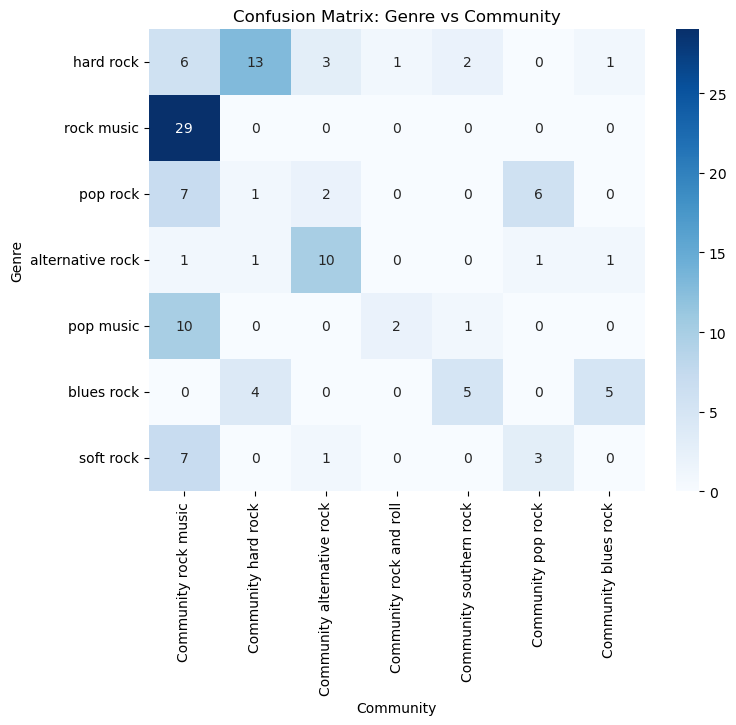

In [390]:
create_D_matrix(first_partition)

<center><sup>Figure: Confusion matrix for partition based on first genre in the list</sup></center>

The confusion matrix shows that the communities are accurately corresponding to the genres. Most of the nodes are concentrated in the broad *rock music* genre, as the first genre in the infobox usually is the broadest genre.
Another interesting observation is that *southern rock* and *blues* both contain a higher amount of nodes for the *blues* genre, as southern rock is a subgenre that blends blues, country and rock.

I also plotted the confusion matrix for the Louvain partition.

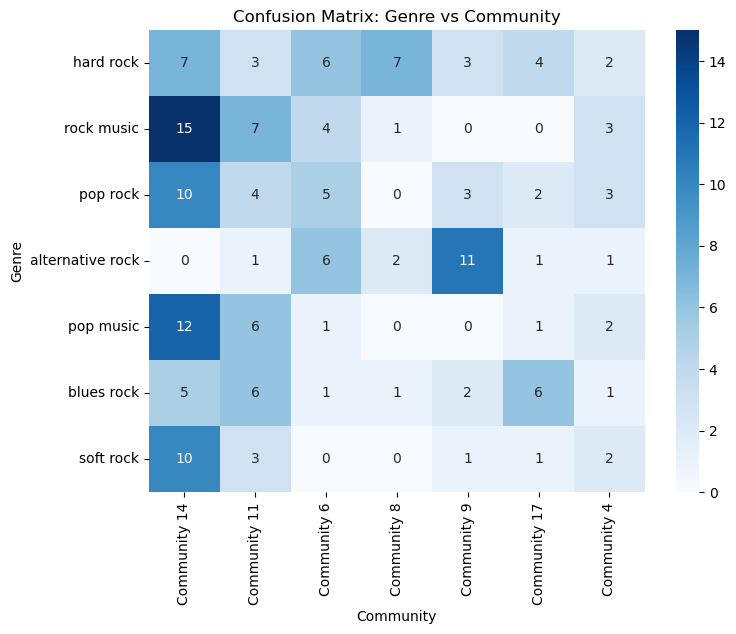

In [391]:
create_D_matrix(louvain_dict)

<center><sup>Figure 3: Confusion matrix for Louvain partition</sup></center>

From the confusion matrix it can be observed that the Louvain partition distributes nodes more widely across genres, as they are not all concentrated on the *rock music* genre as for the first genre partition.

### **Plot the communities and comment on your results.**

##### **Corresponding text from Week 7 Part 2 exercise:** ##### 

**Visualize the network, using the Force Atlas algorithm.**
* **This time assign each node a different color based on its structural community.**
* **Note: If there's a lot of small communities, it's OK to only color the 5-10 largest communities (you can make the remaing nodes light gray or some netural color)**
* **Describe the structure you observe.**

With the help of an LLM, I created a function to plot the network with the Force Atlas algorithm.

In [392]:
# Create color map based on partition
def create_color_map(partition, subnetwork):
    # Extract the artists grouped in communities
    community_list = [c for c in partition.values()]
    # Generate a color for each community
    num_communities = len(community_list)
    color_map = list(mcolors.TABLEAU_COLORS.values())
    while len(color_map) < num_communities:
        color_map += list(mcolors.TABLEAU_COLORS.values())
    colors = color_map[:num_communities]

    # Map node to its community color
    node_colors = []
    node_to_color = {}
    for idx, community in enumerate(community_list):
        for node in community:
            node_to_color[node] = colors[idx]

    for node in subnetwork.nodes():
        node_colors.append(node_to_color.get(node, "#cccccc")) 
    return node_colors

# Plot graph with Force Atlas
def plot_force_atlas(partition, subnetwork, ax=None, title="Force-Atlas layout colored by community"):
    community_list = [c for c in partition.values()]
    partition_keys = list(partition.keys())

    # Generate colors
    num_communities = len(community_list)
    color_map = list(mcolors.TABLEAU_COLORS.values())
    while len(color_map) < num_communities:
        color_map += list(mcolors.CSS4_COLORS.values())
    colors = color_map[:num_communities]

    # Create color mapping
    node_colors = create_color_map(partition, subnetwork)

    # Create layout
    pos = nx.forceatlas2_layout(subnetwork, scaling_ratio=20, gravity=0.1)

    # Use provided axis or create one
    if ax is None:
        fig, ax = plt.subplots(figsize=(14, 8))

    nx.draw(subnetwork, pos=pos, node_color=node_colors, ax=ax,
            with_labels=False, node_size=50)

    # Legend: top 10 largest communities
    community_sizes = [(idx, key, len(comm)) for idx, (key, comm) in enumerate(partition.items())]
    community_sizes.sort(key=lambda x: x[2], reverse=True)

    legend_elements = []
    for idx, key, size in community_sizes[:10]:
        legend_elements.append(plt.Line2D([0], [0], marker='o', color='w',
                                        markerfacecolor=colors[idx],
                                        markersize=10,
                                        label=f'{key} ({size} nodes)'))

    ax.legend(handles=legend_elements, loc='upper right', bbox_to_anchor=(1.15, 1), fontsize=9)
    ax.set_title(title, fontsize=14, pad=10)


I plotted based on the first genre partition and the Louvain partition.

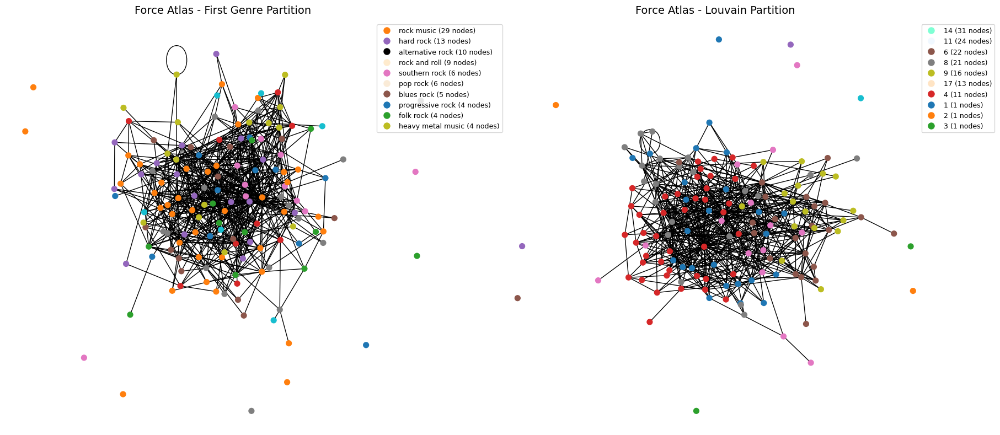

In [393]:
fig, axes = plt.subplots(1, 2, figsize=(18, 8))

plot_force_atlas(first_partition, subnetwork, ax=axes[0], title="Force Atlas - First Genre Partition")
plot_force_atlas(louvain_dict, subnetwork, ax=axes[1], title="Force Atlas - Louvain Partition")

plt.tight_layout()
plt.show()


<center><sup>Figure: The left plot displays the Force-Atlas layout colored by community for the first genre partition. The right plot displays the Force-Atlas layout colored by community for the Louvain partition</sup></center>

With the help of an LLM, I tried another way to visualise the graphs, which would group the nodes in the same community closer together.

In [394]:
def plot_community_aware(partition, subnetwork, ax=None, title="Community-aware layout: nodes in same community are closer"):
    # Extract the artists grouped in communities
    community_list = [c for c in partition.values()]
    partition_keys = list(partition.keys())
    
    # Generate a color for each community
    num_communities = len(community_list)
    color_map = list(mcolors.TABLEAU_COLORS.values())
    while len(color_map) < num_communities:
        color_map += list(mcolors.CSS4_COLORS.values())
    colors = color_map[:num_communities]

    # Assign each community a block position
    block_positions = {}
    block_size = 10  # Spread between communities
    for idx, community in enumerate(community_list):
        # Place each block along a circle
        angle = 2 * np.pi * idx / num_communities
        block_positions[idx] = (block_size * np.cos(angle), block_size * np.sin(angle))

    # Assign initial positions for each node based on its community
    init_pos = {}
    for idx, community in enumerate(community_list):
        bx, by = block_positions[idx]
        for node in community:
            # Add small random jitter within the block
            init_pos[node] = (bx + np.random.uniform(-1, 1), by + np.random.uniform(-1, 1))

    # Create color map based on partition
    node_colors = create_color_map(partition, subnetwork)

    # Use spring_layout with these initial positions
    pos = nx.spring_layout(subnetwork, pos=init_pos, seed=42,
                        k=2.0, iterations=20)

    pos_scaled = {node: (x * 20, y * 20) for node, (x, y) in pos.items()}

    # Use provided axis or create a new one
    if ax is None:
        fig, ax = plt.subplots(figsize=(24, 20))

    nx.draw(subnetwork, pos=pos_scaled, node_color=node_colors,
            with_labels=False, node_size=150, edge_color="#cccccc", ax=ax)
    
    # Create legend - show top 10 largest communities
    community_sizes = [(idx, key, len(comm)) for idx, (key, comm) in enumerate(partition.items())]
    community_sizes.sort(key=lambda x: x[2], reverse=True)
    
    legend_elements = []
    for idx, key, size in community_sizes[:10]:  # Top 10 communities
        legend_elements.append(plt.Line2D([0], [0], marker='o', color='w',
                                        markerfacecolor=colors[idx],
                                        markersize=8,
                                        label=f'{key} ({size} nodes)'))

    ax.legend(handles=legend_elements, loc='upper right', fontsize=10)
    ax.set_title(title, fontsize=14, pad=10)


I plotted the first genre partition and the Louvain partition with the custom layout.

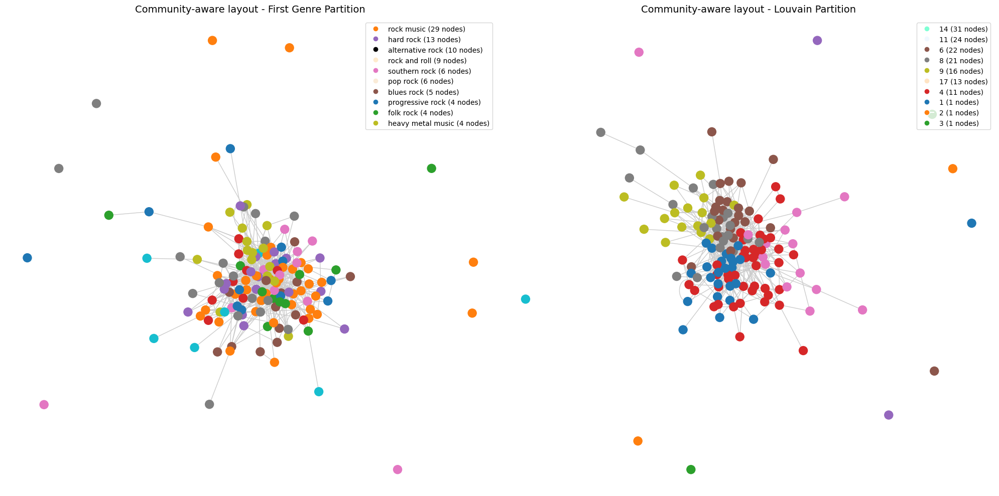

In [395]:
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

plot_community_aware(first_partition, subnetwork, ax=axes[0],
                    title="Community-aware layout - First Genre Partition")

plot_community_aware(louvain_dict, subnetwork, ax=axes[1],
                    title="Community-aware layout - Louvain Partition")

plt.tight_layout()
plt.show()


<center><sup>Figure: The left plot displays the custom layout colored by community for the first genre partition. The right plot displays the custom layout colored by community for the Louvain partition</sup></center>

The updated function works better for visualising the Louvain partition, emphasizing the grouping.

##### **Corresponding text from Week 7 Part 2 exercise:** ##### 

**Keep using the community labels from above, but now visualize only the backbone-edges from your favorite network backbone from Week 5. Do the community correspond to the backbone structure you detected?**

In order to visualize the backbone-edges from the network, I download the network's backbone from Github.

In [396]:
# Load the backbone
url = "https://raw.githubusercontent.com/denisababeii/socialgraphs_assignment2/refs/heads/denisa/backbone.graphml"
    
try:
    with urllib.request.urlopen(url) as response:
        data = response.read()
        
    backbone = nx.read_graphml(io.BytesIO(data))
    print(f"✓ Backbone network loaded successfully!")
    print(f"  Nodes: {network.number_of_nodes()}")
    print(f"  Edges: {network.number_of_edges()}")
        
except Exception as e:
    print(f"✗ Error loading network: {str(e)}")
    backbone = None

✓ Backbone network loaded successfully!
  Nodes: 484
  Edges: 6301


I plotted the first genre partition of the backbone with the Force Atlas algorithm and my custom visualization function.

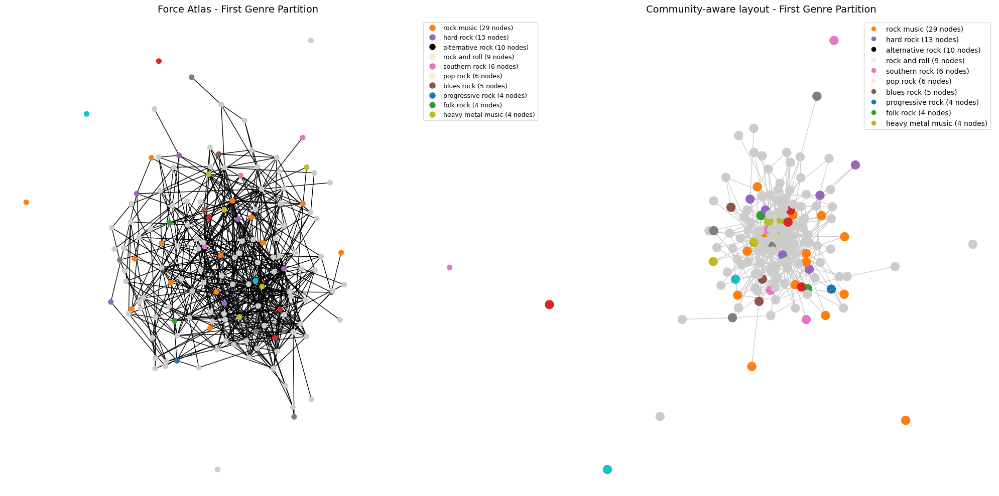

In [397]:
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

plot_force_atlas(first_partition, backbone, ax=axes[0],
                    title="Force Atlas - First Genre Partition")

plot_community_aware(first_partition, backbone, ax=axes[1],
                    title="Community-aware layout - First Genre Partition")

plt.tight_layout()
plt.show()

<center><sup>Figure: The left plot displays the backbone of the Force-Atlas layout colored by community for the first genre partition. The right plot displays the backbone of the custom layout colored by community for the first genre partition</sup></center>

I plotted the Louvain partition of the backbone with Force Atlas and with the help of my custom visualization function.

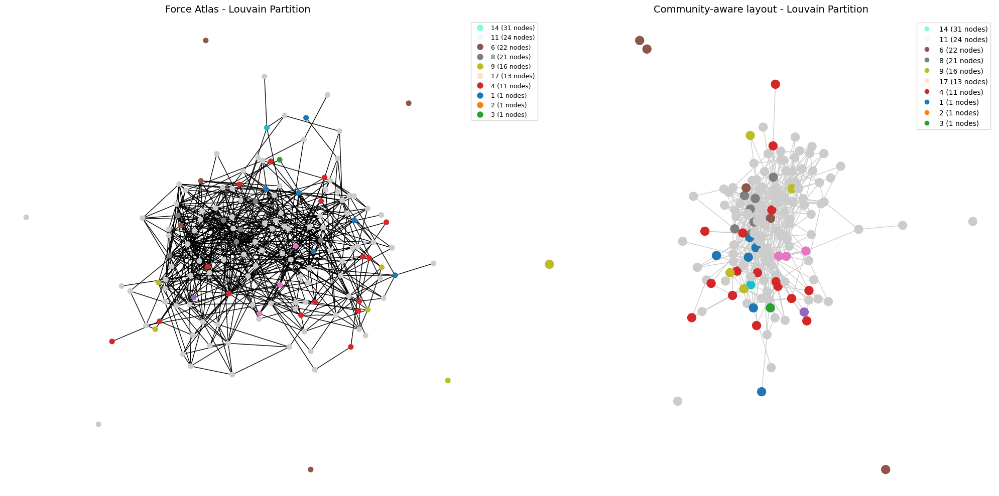

In [398]:
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

plot_force_atlas(louvain_dict, backbone, ax=axes[0],
                    title="Force Atlas - Louvain Partition")

plot_community_aware(louvain_dict, backbone, ax=axes[1],
                    title="Community-aware layout - Louvain Partition")

plt.tight_layout()
plt.show()

<center><sup>Figure: The left plot displays the backbone of the Force-Atlas layout colored by community for the Louvain partition. The right plot displays the backbone of the custom layout colored by community for the Louvain partition</sup></center>

# **Part 3: TF-IDF to understand genres and communities**

### **Explain the concept of TF-IDF in your own words and how it can help you understand the genres and communities.**

Note: All the formulas provided are referenced from https://en.wikipedia.org/wiki/Tf%E2%80%93idf

TF-IDF (Term Frequency - Inverse Document Frequency) is a numerical scoring system that combines TF and IDF to evaluate the importance of word in a document. In order to understand TF-IDF, we need to understand what TF and IDF are.

TF, short for Term Frequency, measures how frequent a word appears in a document. The more a word appears, the higher TF score is going to be and the more important it might be to that document. The simplest way to calculate TF is to count the number of times a word appears in a document. Besides that, there are several other ways to determine the value of TF. Here are some of the available weighting schemes:

Binary: $0, 1$

Term frequency: $\frac{f_{w,d}}{\sum_{w'\in d}{f_{w',d}}}$

Log normalization: $\log(1 + f_{w,d})$

Double normalization: $0.5 + 0.5 \cdot \frac{f_{w,d}}{\max_{w' \in d}f_{w',d}}$

Double normalization $K$: $K + (1 - K) \frac{f_{w,d}}{\max_{w' \in d} f_{w',d}}$

Where $f_{w,d}$ represent the raw count of word $w$ in document $d$.

IDF, short for Inverse Document Frequency, measures how rare a word is across all documents. The less number of documents that contain a word, the higher the IDF score is going to be and the rarer or characteristic it is to those documents. It is calculated by taking the logarithm of inverse fraction of the documents that contain the word ( $\log\frac{N}{n_w} = -\log\frac{n_w}{N}$ ). In addition, there also some other types of IDF. Here are some of the other weighting schemes:

Unary (just TF): $1$

Inverse document frequency smooth: $\log \left( \frac{N}{1 + n_w} \right) + 1$

Inverse document frequency max: $\log \left( \frac{\max_{w' \in d} n_{w'}}{1 + n_t} \right)$

Probabilistic inverse document frequency: $\log \frac{N - n_w}{n_w}$

Where $N$ is total number of documents and $n_t$ is the number of documents that contains the word

TF-IDF is calculated by taking the product of TF and IDF scores of a word, $TD-IDF(w,d) = TF(w,d)\cdot IDF(w)$. This method highlights words in a document that have not only high frequency but also rare in other documents. Although words like stopwords or generic nouns (such as album, song, release) have a high TF, it is penalized by existing in most documents causing a low IDF scores. Words with high TF-IDF are a good characteristics of a document as it is frequently seen in that document but still uncommon in other documents.

In understanding genres and communities, TF-IDF is really helpful in identifying words that are characteristics to a specific group (genres or communities). Words that have high TF-IDF scores shows what vocabulary uniquely identifies that specific group. Only words that has a balance of being frequently seen within the group and unique enough across grorups will receive a high TF-IDF score, proving that they are unique characteristics of that group.

### **Calculate and visualize TF-IDF for the genres and communities.**

First, we sort the genres and communities by their numbers of members. The top 7 genre names and community ids is sotred for visualization later.

In [399]:
# Prepare the top n genres and communities
n = len(louvain_dict) if len(louvain_dict) < 7 else 7

sorted_community_sizes = sorted([(len(members), comm_id) for comm_id, members in louvain_dict.items()])[::-1]
top_communities = [comm_id for count, comm_id in sorted_community_sizes][:n]

top_genres = [genre for genre, count in stats['top_15_genres'][:n]]

In [400]:
# Just a helper function to get the pages content
def load_content(content):
    # Parse the JSON structure
    data = json.loads(content)
    
    # Navigate to the wikitext content
    pages = data.get('query', {}).get('pages', {})
    if not pages:
        return ""
    
    # Get the page
    page_id = list(pages.keys())[0]
    wikitext = pages[page_id].get('revisions', [{}])[0].get('slots', {}).get('main', {}).get('*', '')
    
    return wikitext

In [401]:
# Combine documents for each genre into a list of strings
genre_docs = {}
for nodes in subnetwork.nodes():
    genres = subnetwork.nodes[nodes]['genres']
    content = load_content(subnetwork.nodes[nodes]['content'])
    for genre in genres:
        if genre not in genre_docs:
            genre_docs[genre] = []
        genre_docs[genre].append(content)

# Join documents for each genre into a single string
for genre, docs in genre_docs.items():
    genre_docs[genre] = ' '.join(docs)

print(f"\n{len(genre_docs)} genre documents prepared\n")


144 genre documents prepared



In [402]:
# Combine documents for each community into a list of strings
community_docs = {}
for comm_id in louvain_dict.keys():
    members = louvain_dict[comm_id]
    for node in members:
        content = load_content(subnetwork.nodes[node]['content'])
        if comm_id not in community_docs:
            community_docs[comm_id] = []
        community_docs[comm_id].append(content)

# Join documents for each community into a single string
for comm_id, docs in community_docs.items():
    community_docs[comm_id] = ' '.join(docs)

print(f"\n{len(community_docs)} community documents prepared\n")


17 community documents prepared



##### **Corresponding text from Week 7 Part 2 exercises:** #####

**Action items**

* **Tokenize the pages into one long string per genre**

* **Remove all punctuation from your list of tokens**

* **Set everything to lower case**

* **(Optional) Lemmatize your words**

* **It’s a good idea to filter out rare words (e.g. words that only appear less than 5 times).**

In [403]:
# Download necessary NLTK data
try:
    nltk.data.find('corpora/stopwords')
except LookupError:
    nltk.download('stopwords')

try:
    nltk.data.find('corpora/wordnet')
except LookupError:
    nltk.download('wordnet')

# Initialize lemmatizer and stop words
lemmatizer = WordNetLemmatizer()
stop_words = set(stopwords.words('english'))

[nltk_data] Downloading package wordnet to
[nltk_data]     /Users/kyleelyk/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [404]:
def clean_and_tokenize(text):
    # Remove URLs and web-specific content
    text = re.sub(r'https?://\S+', '', text)  # Remove http/https URLs
    text = re.sub(r'www\.\S+', '', text)  # Remove www. domains
    text = re.sub(r'\S+\.(com|org|net|edu|gov|uk)\b', '', text, flags=re.IGNORECASE)
    
    # Remove Wikipedia/HTML markup
    text = re.sub(r'\{\{[^}]+\}\}', '', text)  # Remove {{template}}
    text = re.sub(r'\[\[[^\]]+\]\]', '', text)  # Remove [[links]]
    text = re.sub(r'<ref[^>]*>.*?</ref>', '', text, flags=re.DOTALL)  # Remove <ref> tags
    text = re.sub(r'<[^>]+>', '', text)  # Remove all HTML tags
    text = re.sub(r'\[\[(Category|File|Image):[^\]]+\]\]', '', text, flags=re.IGNORECASE)
    text = re.sub(r'\bstyle\s*=\s*["\'][^"\']*["\']', '', text)  # Remove style attributes
    text = re.sub(r'\b(align|valign|colspan|rowspan|width|height)\b\s*=\s*\S+', '', text)
    
    # Set everything to lowercase
    text = text.lower()
    
    # Remove all punctuation
    text = text.translate(str.maketrans('', '', string.punctuation))
    
    # Tokenize (split by whitespace)
    tokens = text.split()
    
    # Filter, remove stop words, and lemmatize
    cleaned_tokens = []
    for token in tokens:
        # Skip stop words
        if token in stop_words:
            continue
        
        # Skip if not alphabetic
        if not token.isalpha():
            continue
        
        # Skip very short words
        if len(token) < 3:
            continue
        
        # Skip very long words
        if len(token) > 20:
            continue
        
        # Lemmatize to reduce inflectional forms to base form
        lemmatized = lemmatizer.lemmatize(token)

        # Add to cleaned tokens
        cleaned_tokens.append(lemmatized)
    
    return cleaned_tokens

### **Calculate and visualize TF-IDF for the genres and communities.**

##### **Corresponding text from Week 7 Part 6 exercise:** #####

* **We’re now ready to calculate TF-IDFs. Do that for each genre.**

For TF, term frequency weighting scheme expressed by $\frac{f_{w,d}}{\sum_{w'\in d}{f_{w',d}}}$, is applied. For IDF, standard inverse document frequency weighting schem expressed by, $\log\frac{N}{n_w}$, is applied.

In [405]:
def compute_tf_idf(documents_dict, min_df=2):
    # Tokenize and compute term frequencies
    doc_term_freq = {}
    doc_total_terms = {}

    for doc_id, text in documents_dict.items():
        tokens = clean_and_tokenize(text)
        term_counts = Counter(tokens)
        doc_term_freq[doc_id] = term_counts
        doc_total_terms[doc_id] = len(tokens)
    
    # Compute document frequency for each term
    term_doc_freq = Counter()
    all_terms = set()
    
    for doc_id, term_counts in doc_term_freq.items():
        for term in term_counts.keys():
            term_doc_freq[term] += 1
            all_terms.add(term)

    # Filter by document frequency: keep terms appearing in at least min_df documents
    N = len(documents_dict)
    filtered_terms = {term for term, df in term_doc_freq.items() if df >= min_df}
    
    # Calculate IDF only for filtered terms
    idf_scores = {}
    for term in filtered_terms:
        doc_freq = term_doc_freq[term]
        # Using standard IDF: log(N/df)
        idf = np.log(N / doc_freq)
        idf_scores[term] = idf

    # Compute TF-IDF for each document
    tf_idf_matrix = {}
    for doc_id, term_counts in doc_term_freq.items():
        tf_idf_vector = {}
        total_terms = doc_total_terms[doc_id]
        
        # Skip empty documents to avoid division by zero
        if total_terms == 0:
            tf_idf_matrix[doc_id] = {}
            continue

        for term, count in term_counts.items():
            # Using term frequency TF: term_count / total_terms
            tf = count / total_terms
            if term in idf_scores:
                tf_idf = tf * idf_scores[term]
                if tf_idf > 0:
                    tf_idf_vector[term] = tf_idf

        tf_idf_matrix[doc_id] = tf_idf_vector
    return tf_idf_matrix

In [406]:
genre_tf_idf = compute_tf_idf(genre_docs, min_df=1)

In [407]:
community_tf_idf = compute_tf_idf(community_docs, min_df=1)

##### **Corresponding text from Week 7 Part 6 exercise:** #####

* **Which base logarithm did you use? Is that important?.**

I used natural logarithm to calculate TF-IDF. Observing the IDF formula:

$\log_b \frac{N}{n_t} = \frac{\log_k \frac{N}{n_t}}{\log_k b}$

Changing the base will just multiplies all IDF scores by $\frac{1}{\log_k b}$. Meaning that the ranking of the words will stay the same no matter which base logarithm used. What is important to identify from TF-IDF is the rankings of the words not the value of the scores itself. So, no it is not important which base logarithm is used.

##### **Corresponding text from Week 7 Part 6 exercise:** #####

* **List the 10 top words for each genre accourding to TF-IDF. Are these 10 words more descriptive of the genre than just the TF? Justify your answer.**

In [408]:
def visualize_tfidf_terms(tf_idf_dict, labels, title, top_n=15, label_formatter=None):
    # Create visualization
    fig, axes = plt.subplots(3, 3, figsize=(20, 16))
    axes = axes.flatten()
    
    for idx, label in enumerate(labels):
        ax = axes[idx]
        
        # Format label for display
        display_label = label_formatter(label) if label_formatter else str(label)
        
        if label not in tf_idf_dict or not tf_idf_dict[label]:
            ax.text(0.5, 0.5, f'No data\nfor\n{display_label}',
                    ha='center', va='center', fontsize=12, color='gray')
            ax.set_title(display_label, fontsize=11, fontweight='bold')
            ax.axis('off')
            continue
        
        # Get top N terms
        top_terms = sorted(tf_idf_dict[label].items(), key=lambda x: x[1], reverse=True)[:top_n]
        terms, scores = zip(*top_terms)
        
        # Plot
        y_pos = range(len(terms))
        ax.barh(y_pos, scores, color='steelblue')
        ax.set_yticks(y_pos)
        ax.set_yticklabels(terms, fontsize=9)
        ax.invert_yaxis()
        ax.set_xlabel('TF-IDF Score', fontsize=10)
        ax.set_title(display_label, fontsize=11, fontweight='bold')
        ax.grid(axis='x', alpha=0.3)
    
    # Hide unused subplots
    for idx in range(len(labels), len(axes)):
        axes[idx].axis('off')
    
    plt.suptitle(title, fontsize=16, fontweight='bold', y=0.995)
    plt.tight_layout()
    plt.show()

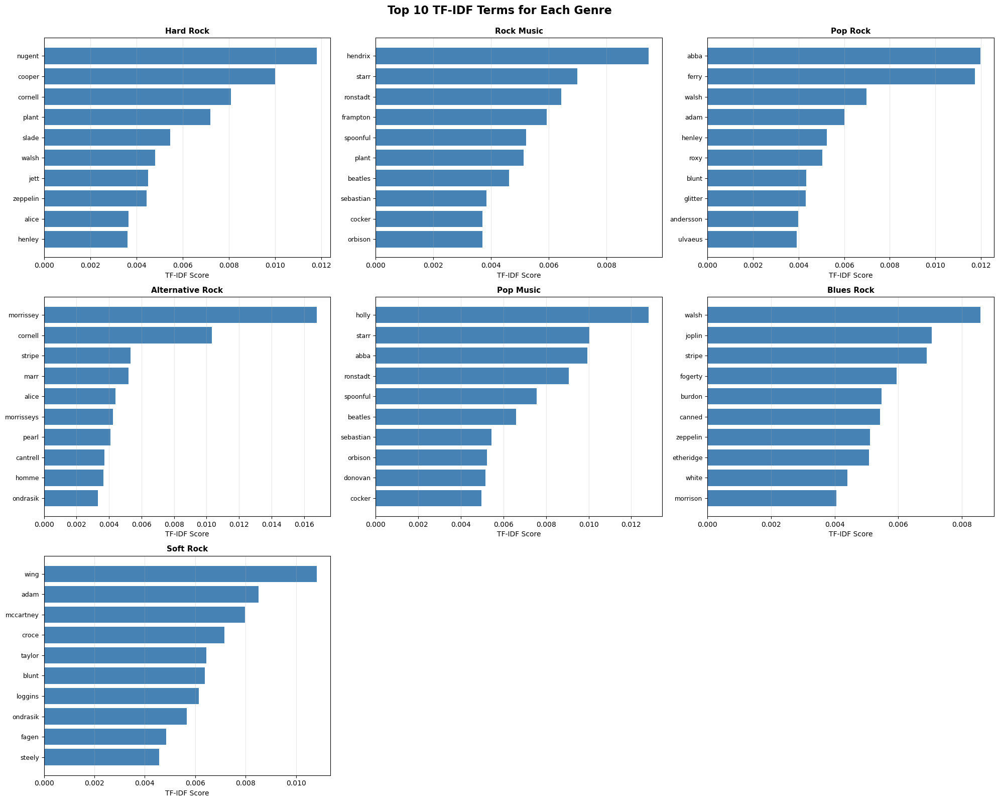

In [409]:
# Visualize top 10 TF-IDF terms for each of the top genres
visualize_tfidf_terms(
    genre_tf_idf,
    top_genres,
    'Top 10 TF-IDF Terms for Each Genre',
    top_n=10,
    label_formatter=lambda x: x.title()
)

<center><sup>Figure: The bar plots show the top 10 TF-IDF terms for each of the 7 top genres.</sup></center>

If we are just using TF, assuming we still clean the tokens beforehand, general music related words such as *album, music, song, release, band* will dominate the top TF ranking. Maybe some popular rock artist would show up in the top TF ranking here and there will overall won't be a good description of each genre.

Whereas in the Figure above, we can clearly see a lot of artist names in each of the top TF-IDF ranking. Take pop rock for example, we can see that *ABBA* is the top TF-IDF word, which makes sense as *ABBA* is a very popular pop rock band. Another example is the rock music genre, where *Hendrix* is the top TF-IDF word, which also makes sense as *Jimi Hendrix* is a very influential rock artist. This shows that using the TF-IDF method helps us identify words that are descriptive of the genre. In this case, popular artists within that genre appear more in the top 10 TF-IDF ranking.

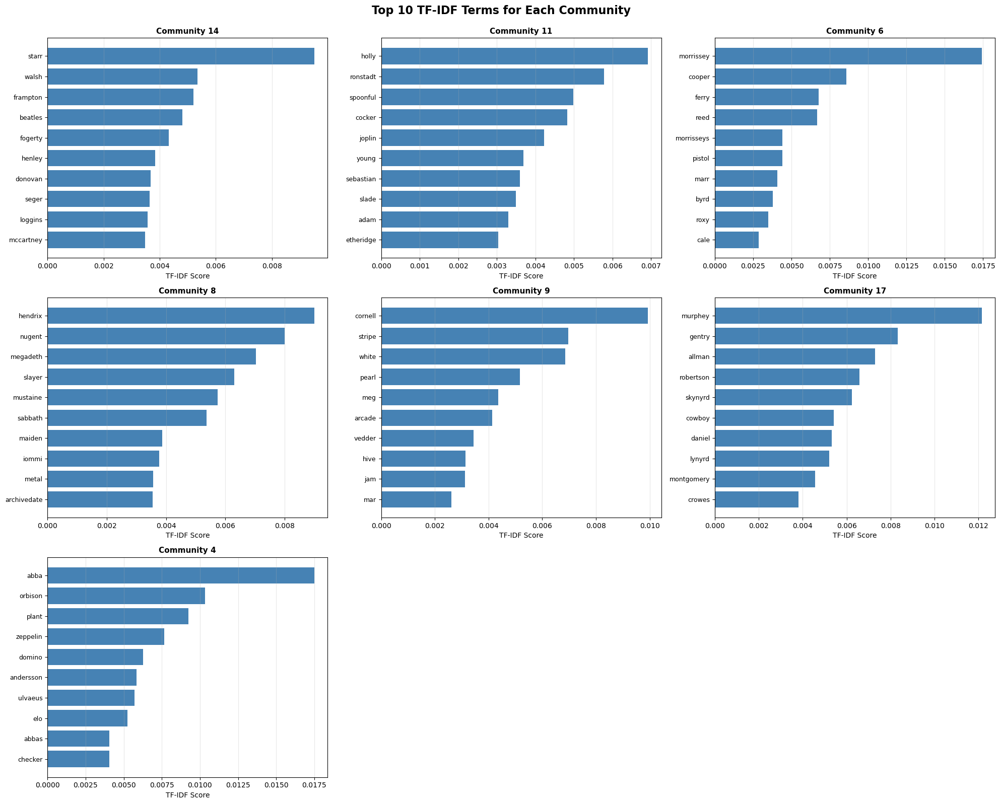

In [410]:
# Visualize top 10 TF-IDF terms for each of the top communities
visualize_tfidf_terms(
    community_tf_idf,
    top_communities,
    'Top 10 TF-IDF Terms for Each Community',
    top_n=10,
    label_formatter=lambda x: f'Community {x}'
)

<center><sup>Figure: The bar plots show the top 10 TF-IDF terms for each of the 7 top communities.</sup></center>

##### **Corresponding text from Week 7 Part 6 exercise:** #####

* **Create a wordcloud for each genre.**

In [411]:
def create_tfidf_wordclouds(tfidf_dict, labels, title, colormap_base='viridis'):
    fig, axes = plt.subplots(3, 3, figsize=(22, 18))
    axes = axes.flatten()
    
    # Different colormaps for variety
    colormaps = ['viridis', 'plasma', 'inferno', 'magma', 'cividis', 'Blues', 'Reds']
    
    for idx, label in enumerate(labels):
        ax = axes[idx]
        
        if label not in tfidf_dict or not tfidf_dict[label]:
            # Handle missing data
            display_label = label.title() if isinstance(label, str) else f'Community {label}'
            ax.text(0.5, 0.5, f'No data\nfor\n{display_label}',
                    ha='center', va='center', fontsize=14, color='gray')
            ax.set_title(display_label, fontsize=12, fontweight='bold', pad=10)
            ax.axis('off')
            continue
        
        # Generate word cloud from TF-IDF scores
        wc = WordCloud(width=800, height=600,
                        background_color='white',
                        colormap=colormaps[idx % len(colormaps)],
                        max_words=100,
                        relative_scaling=0.5,
                        min_font_size=8).generate_from_frequencies(tfidf_dict[label])
        
        # Display
        ax.imshow(wc, interpolation='bilinear')
        
        # Format title based on label type
        if isinstance(label, str):
            display_label = label.title()
        else:
            display_label = f'Community {label}'
        
        ax.set_title(display_label, fontsize=12, fontweight='bold', pad=10)
        ax.axis('off')
    
    # Hide unused subplots
    for idx in range(len(labels), len(axes)):
        axes[idx].axis('off')
    
    plt.suptitle(title, fontsize=16, fontweight='bold', y=0.995)
    plt.tight_layout()
    plt.show()

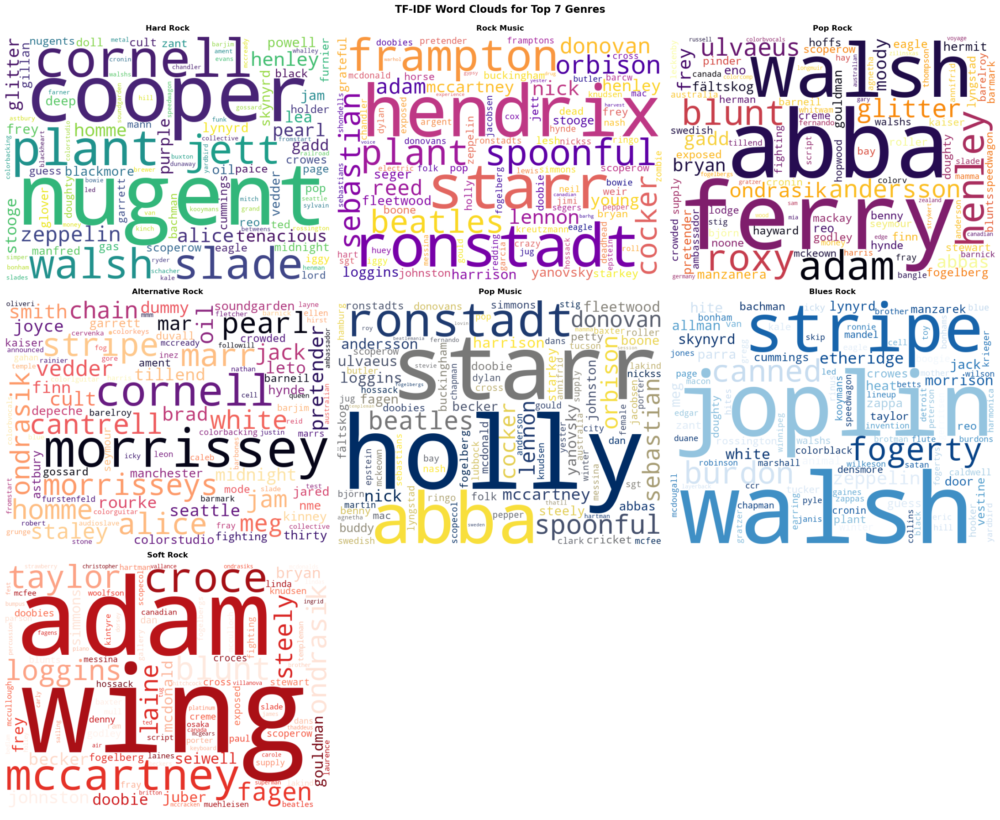

In [412]:
# For genres
create_tfidf_wordclouds(
    genre_tf_idf,
    top_genres,
    'TF-IDF Word Clouds for Top 7 Genres'
)

<center><sup>Figure: The wordcloud shows the top TF-IDF words for each of the 7 top genres.</sup></center>

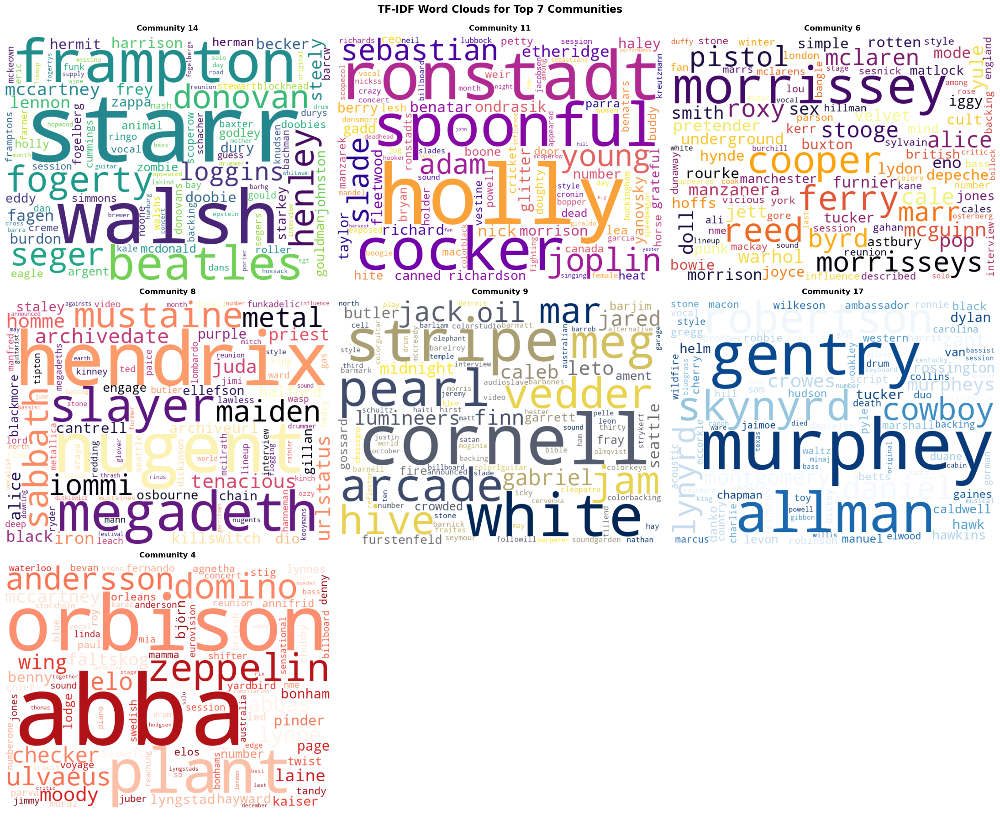

In [413]:
# For communities
create_tfidf_wordclouds(
    community_tf_idf,
    top_communities,
    'TF-IDF Word Clouds for Top 7 Communities'
)

<center><sup>Figure: The wordcloud shows the top TF-IDF words for each of the 7 top communities.</sup></center>

### **Use the matrix $D$ (Lecture 7, part 2) to dicusss the difference between the word-clouds between genres and communities.**

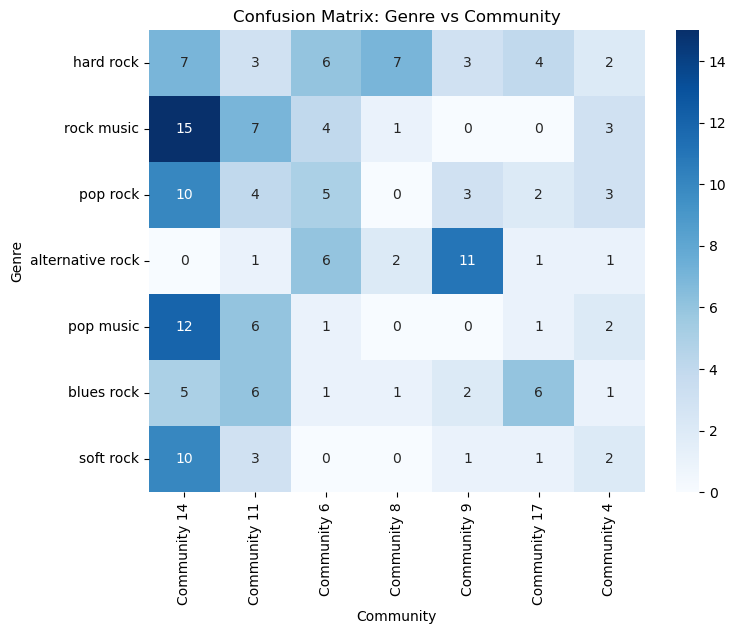

<center><sup>Figure: Just a copy of the matrix <i>D</i> that maps genres to Louvain based communities from part 2 </sup></center>

The matrix *D* (from Part 2) shows the mapping between the human labeled genres and Louvain based communities. We can see that community 14 are super clustered from the fact that it contains many different genres (rock music, pop music, pop rock, etc). This can also be differentiated in the TF-IDF wordclouds. In community 14, the wordcloud is dominated by *framton, starr, walsh, beatles*. If we take a look at the genres wordclouds, *framton* and *beatles* can be seen in rock music, *starr* in pop music, *walsh* in blues rock and pop rock. This shows that the super clustered community 14 can also be seen by observing the two wordclouds.

In contrast, community 9 has a relatively strong mapping with alternative rock. This can also be seen from the two wordclouds. Many of the top ranked words in community 9 can also be seen in alternative rock wordcloud. This includes words like *cornell, stripe, white, oil, mar* and many others. But since it is not a pure mapping between community 9 and alternative rock, we can still see those words in other genres wordclouds. For instance, *cornell* in hard rock and *stripe* in blues rock. This is also proven in the matrix *D* as community 9 still share the same artists with both hard rock and blues rock

# **Part 4: Sentiment of the artists and communities**

### **Calculate the sentiment of the band/artist pages (it is OK to work with the sub-network of artists-with-genre) and describe your findings using stats and visualization, inspired by the first exercise of week 8.**

##### **Corresponding text from Week 8 Part 1 exercise:** #####

* **Download the LabMT wordlist. It’s available as supplementary material from Temporal Patterns of Happiness and Information in a Global Social Network: Hedonometrics and Twitter (Data Set S1). Describe briefly how the list was generated.**

They collected a large corpus of words from Twitter and selected the top 10,000 most frequently used. Then these selected list of words are rated by humans on Amazon Mechanical Turk on an integer scale from 1 to 9.

In [414]:
url = "https://journals.plos.org/plosone/article/file?id=10.1371/journal.pone.0026752.s001&type=supplementary"

try:
    # Download the file
    urllib.request.urlretrieve(url, "labMT_wordlist.txt")
    
    # Load it as a dataframe
    labmt = pd.read_csv("labMT_wordlist.txt", sep='\t', skiprows=2)
    print(f"  Loaded {len(labmt)} words")
    
    # Create dictionary: word -> happiness score
    labmt_dict = dict(zip(labmt['word'].str.lower(), labmt['happiness_average']))
    
except Exception as e:
    print(f"✗ Error: {e}")

  Loaded 10222 words


##### **Corresponding text from Week 8 Part 1 exercise:** #####

* **Based on the LabMT word list, write a function that calculates sentiment given a list of tokens (the tokens should be lower case, etc).**

In [415]:
def calculate_sentiment(tokens, sentiment_dict=labmt_dict):
    # Filter tokens that exist in our sentiment dictionary
    scored_tokens = [sentiment_dict[token] for token in tokens if token in sentiment_dict]
    
    # Return average, or None if no tokens matched
    if scored_tokens:
        return sum(scored_tokens) / len(scored_tokens)
    else:
        return None

##### **Corresponding text from Week 8 Part 1 exercise:** #####

* **Iterate over the nodes in your network, tokenize each page, and calculate sentiment every single page. Now you have sentiment as a new nodal property.**

In [416]:
# Counter for statistics
sentiments_calculated = 0
sentiments_failed = 0
all_sentiments = []

# Iterate through all nodes
for node in network.nodes():
    # Get the page content
    content = network.nodes[node].get('content', '')

    if not content:
        network.nodes[node]['sentiment'] = None
        sentiments_failed += 1
        continue
    
    content = load_content(content)
    
    # Clean and tokenize
    tokens = clean_and_tokenize(content)
    
    # Calculate sentiment
    sentiment = calculate_sentiment(tokens)
    
    # Store as node attribute
    network.nodes[node]['sentiment'] = sentiment
    
    if sentiment is not None:
        sentiments_calculated += 1
        all_sentiments.append(sentiment)
    else:
        sentiments_failed += 1

print(f"{'Sentiments calculated:':<30}{sentiments_calculated}")
print(f"{'Failed (no matching words):':<30}{sentiments_failed}")
print(f"{'Total nodes:':<30}{network.number_of_nodes()}")

Sentiments calculated:        457
Failed (no matching words):   27
Total nodes:                  484


##### **Corresponding text from Week 8 Part 1 exercise:** #####

* **Calculate the average sentiment across all the pages. Also calculate the median, variance, 25th percentile, 75th percentile.**

In [417]:
# Calculate statistics
sentiment_mean = np.mean(all_sentiments)
sentiment_median = np.median(all_sentiments)
sentiment_variance = np.var(all_sentiments)
sentiment_std = np.std(all_sentiments)
sentiment_25th = np.percentile(all_sentiments, 25)
sentiment_75th = np.percentile(all_sentiments, 75)
sentiment_min = np.min(all_sentiments)
sentiment_max = np.max(all_sentiments)

print("Sentiment Statistics:")
print(f"{'Mean:':<28}{sentiment_mean:.2f}")
print(f"{'Median:':<28}{sentiment_median:.2f}")
print(f"{'Variance:':<28}{sentiment_variance:.2f}")
print(f"{'Std Deviation:':<28}{sentiment_std:.2f}")
print(f"{'25th Percentile (Q1):':<28}{sentiment_25th:.2f}")
print(f"{'75th Percentile (Q3):':<28}{sentiment_75th:.2f}")
print(f"{'IQR (Q3-Q1):':<28}{sentiment_75th - sentiment_25th:.2f}")
print(f"{'Minimum:':<28}{sentiment_min:.2f}")
print(f"{'Maximum:':<28}{sentiment_max:.2f}")
print(f"{'Range:':<28}{sentiment_max - sentiment_min:.2f}")
print(f"{'Sample size:':<28}{len(all_sentiments)} pages")

Sentiment Statistics:
Mean:                       5.83
Median:                     5.84
Variance:                   0.02
Std Deviation:              0.13
25th Percentile (Q1):       5.77
75th Percentile (Q3):       5.91
IQR (Q3-Q1):                0.14
Minimum:                    5.16
Maximum:                    6.27
Range:                      1.12
Sample size:                457 pages


##### **Corresponding text from Week 8 Part 1 exercise:** #####

* **Remember histograms? Create a histogram of all of the artists’s associated page-sentiments. (And make it a nice histogram - use your histogram making skills from Week 2). Add the mean, median, ect from above to your plot.**

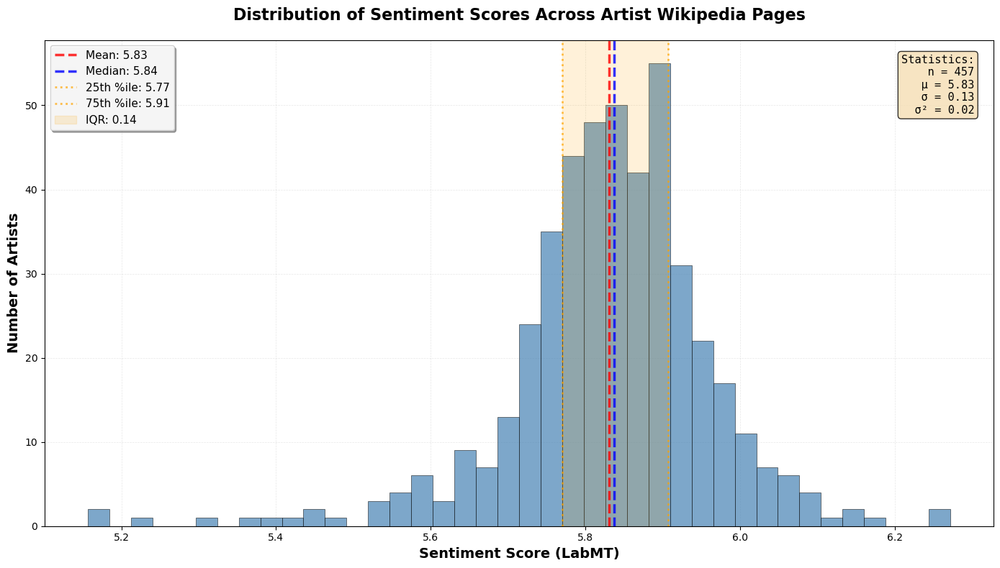

In [418]:
# Set style for a beautiful plot
plt.rcParams['figure.facecolor'] = 'white'

# Create figure
fig, ax = plt.subplots(figsize=(14, 8))

# Create histogram
n, bins, patches = ax.hist(all_sentiments, bins=40, alpha=0.7, color='steelblue',
                        edgecolor='black', linewidth=0.5, density=False)


# Add vertical lines for statistics
ax.axvline(sentiment_mean, color='red', linestyle='--', linewidth=2.5,
        label=f'Mean: {sentiment_mean:.2f}', alpha=0.8)
ax.axvline(sentiment_median, color='blue', linestyle='--', linewidth=2.5,
        label=f'Median: {sentiment_median:.2f}', alpha=0.8)
ax.axvline(sentiment_25th, color='orange', linestyle=':', linewidth=2,
        label=f'25th %ile: {sentiment_25th:.2f}', alpha=0.7)
ax.axvline(sentiment_75th, color='orange', linestyle=':', linewidth=2,
        label=f'75th %ile: {sentiment_75th:.2f}', alpha=0.7)

# Shade the IQR region
ax.axvspan(sentiment_25th, sentiment_75th, alpha=0.15, color='orange',
        label=f'IQR: {sentiment_75th - sentiment_25th:.2f}')

# Labels and title
ax.set_xlabel('Sentiment Score (LabMT)', fontsize=14, fontweight='bold')
ax.set_ylabel('Number of Artists', fontsize=14, fontweight='bold')
ax.set_title('Distribution of Sentiment Scores Across Artist Wikipedia Pages',
                fontsize=16, fontweight='bold', pad=20)

# Add legend
ax.legend(loc='upper left', fontsize=11, framealpha=0.9, shadow=True)

# Add text box with statistics
textstr = '\n'.join([
        f'Statistics:',
        f'  n = {len(all_sentiments)}',
        f'  μ = {sentiment_mean:.2f}',
        f'  σ = {sentiment_std:.2f}',
        f'  σ² = {sentiment_variance:.2f}',
])
props = dict(boxstyle='round', facecolor='wheat', alpha=0.8)
ax.text(0.98, 0.97, textstr, transform=ax.transAxes, fontsize=11,
        verticalalignment='top', horizontalalignment='right', bbox=props,
        family='monospace')

# Grid
ax.grid(True, alpha=0.3, linestyle='--', linewidth=0.5)
ax.set_axisbelow(True)

# Adjust layout
plt.tight_layout()
plt.show()

##### **Corresponding text from Week 8 Part 1 exercise:** #####

* **Who are the 10 artists with happiest and saddest pages?**

In [419]:
# Create a list of (artist, sentiment) tuples for all artists with valid sentiment
artist_sentiments = []
for node in network.nodes():
    sentiment = network.nodes[node]['sentiment']
    if sentiment is not None:
        artist_sentiments.append((node, sentiment))

# Sort by sentiment
artist_sentiments.sort(key=lambda x: x[1])

# Get top 10 saddest and happiest
saddest_10 = artist_sentiments[:10]
happiest_10 = artist_sentiments[-10:][::-1]

print("Top 10 Saddest Artists")
for i, (artist, sentiment) in enumerate(saddest_10, 1):
    print(f"{i:2d}. {artist:40s} - Sentiment: {sentiment:.2f}")

print("\nTop 10 Happiest Artists")
for i, (artist, sentiment) in enumerate(happiest_10, 1):
    print(f"{i:2d}. {artist:40s} - Sentiment: {sentiment:.2f}")

# Calculate difference
if len(happiest_10) > 0 and len(saddest_10) > 0:
    sentiment_range = happiest_10[0][1] - saddest_10[0][1]
    print(f"\nSentiment range (happiest - saddest): {sentiment_range:.2f}")

Top 10 Saddest Artists
 1. poison (american band)|poison            - Sentiment: 5.16
 2. everclear (band)|everclear               - Sentiment: 5.17
 3. garbage (band)|garbage                   - Sentiment: 5.23
 4. keane (band)|keane                       - Sentiment: 5.32
 5. anthrax (american band)|anthrax          - Sentiment: 5.36
 6. traffic (band)|traffic                   - Sentiment: 5.40
 7. 311 (band)|311                           - Sentiment: 5.43
 8. ghost (swedish band)|ghost               - Sentiment: 5.44
 9. hole (band)|hole                         - Sentiment: 5.45
10. 38 special (band)|.38 special            - Sentiment: 5.49

Top 10 Happiest Artists
 1. steppenwolf (band)|steppenwolf           - Sentiment: 6.27
 2. journey (band)|journey                   - Sentiment: 6.25
 3. queen (band)|queen                       - Sentiment: 6.16
 4. pixies (band)|pixies                     - Sentiment: 6.16
 5. live (band)|live                         - Sentiment: 6.15
 6. yes

### **Discuss the sentiment of the communities. Do the findings using TF-IDF during Lecture 7 help you understand your results?**

##### **Corresponding text from Week 8 Part 2 exercise:** #####

* **Last week we calculated the stuctural communities of the graph. For this exercise, we use those communities (just the 10 largest ones, or all your communities if you have fewer than 10). Specifically, you should calculate the average the average sentiment of the nodes in each community to find a community level sentiment.?**

Since our previous confusion matrix *D* are $(7X7)$ and only the top 7 genres and communities are discussed, we will only calculate the average sentiments of the top 7 communities.

In [420]:
# Calculate average sentiment for each community
community_sentiments = {}

for comm_id in top_communities:
    members = louvain_dict[comm_id]
    
    # Get sentiments for all members of this community
    sentiments = []
    for artist in members:
        if artist in network.nodes():
            sentiment = network.nodes[artist].get('sentiment', None)
            if sentiment is not None:
                sentiments.append(sentiment)
    
    # Calculate average
    if sentiments:
        avg_sentiment = np.mean(sentiments)
        community_sentiments[comm_id] = {
            'avg_sentiment': avg_sentiment,
            'size': len(members),
            'sentiment_count': len(sentiments),
            'members': members
        }
    else:
        print(f"\nCommunity {comm_id}:")
        print(f"  Size: {len(members)} members")
        print(f"  No sentiment data available")

for comm_id, sentiment_stats in community_sentiments.items():
    print(f"\nCommunity {comm_id}:")
    print(f"  Average Sentiment: {sentiment_stats['avg_sentiment']:.2f}")


Community 14:
  Average Sentiment: 5.84

Community 11:
  Average Sentiment: 5.82

Community 6:
  Average Sentiment: 5.82

Community 8:
  Average Sentiment: 5.78

Community 9:
  Average Sentiment: 5.87

Community 17:
  Average Sentiment: 5.88

Community 4:
  Average Sentiment: 5.89


##### **Corresponding text from Week 8 Part 2 exercise:** #####

* **Name each community by its three most connected bands. (Or feed the list of bands in each community and ask the LLM to come up with a good name for the community).?**

In [421]:
# Name each community by the 3 most connected bands
community_names = {}

print("Naming Top Communities Based on Most Connected Bands:")

for comm_id in top_communities:
    if comm_id not in community_sentiments:
        continue
    
    members = community_sentiments[comm_id]['members']
    
    # Calculate degree centrality within the community (subgraph)
    community_subgraph = network.subgraph(members)
    degrees = dict(community_subgraph.degree())
    
    # Sort by degree and get top 3 (or fewer if community is small)
    top_3 = sorted(degrees.items(), key=lambda x: x[1], reverse=True)[:3]
    top_3_names = [name for name, degree in top_3]
    
    # Create a descriptive name (handle communities with fewer than 3 members)
    if len(top_3_names) >= 3:
        community_name = f"{top_3_names[0]}, {top_3_names[1]}, {top_3_names[2]}"
    elif len(top_3_names) == 2:
        community_name = f"{top_3_names[0]}, {top_3_names[1]}"
    elif len(top_3_names) == 1:
        community_name = top_3_names[0]
    else:
        community_name = f"Community {comm_id}"
    
    community_names[comm_id] = {
        'short_name': community_name,
        'top_bands': top_3_names,
        'degrees': [degree for name, degree in top_3]
    }
    
    print(f"\nCommunity {comm_id}:")
    print(f"  Name: {community_name}")

Naming Top Communities Based on Most Connected Bands:

Community 14:
  Name: the beatles, the doobie brothers, joe walsh

Community 11:
  Name: janis joplin, linda ronstadt, chuck berry

Community 6:
  Name: sex pistols, the smiths, alice cooper

Community 8:
  Name: iron maiden, black sabbath, deep purple

Community 9:
  Name: pearl jam, midnight oil, peter gabriel

Community 17:
  Name: lynyrd skynyrd, the allman brothers band, charlie daniels

Community 4:
  Name: led zeppelin, robert plant, roy orbison


##### **Corresponding text from Week 8 Part 2 exercise:** #####

* **What are the three happiest communities? (or the two happiest if you have 5 or fewer communities)**

In [422]:
# Sort communities by sentiment
sorted_communities = sorted(community_sentiments.items(), 
                        key=lambda x: x[1]['avg_sentiment'])

# Determine how many to show (3 if >5 communities, 2 if ≤5)
num_to_show = 3

saddest_communities = sorted_communities[:num_to_show]
happiest_communities = sorted_communities[-num_to_show:][::-1]

print(f"Top {num_to_show} saddest communities")

for i, (comm_id, data) in enumerate(saddest_communities, 1):
    name = community_names[comm_id]['short_name']
    sentiment = data['avg_sentiment']
    size = data['size']
    print(f"\n{i}. Community {comm_id}: {name}")
    print(f"   Average Sentiment: {sentiment:.2f}")
    print(f"   Size: {size} members")
    print(f"   Difference from overall mean: {sentiment - sentiment_mean:+.2f}")


Top 3 saddest communities

1. Community 8: iron maiden, black sabbath, deep purple
   Average Sentiment: 5.78
   Size: 21 members
   Difference from overall mean: -0.05

2. Community 11: janis joplin, linda ronstadt, chuck berry
   Average Sentiment: 5.82
   Size: 24 members
   Difference from overall mean: -0.01

3. Community 6: sex pistols, the smiths, alice cooper
   Average Sentiment: 5.82
   Size: 22 members
   Difference from overall mean: -0.01


In [423]:
print(f"\nTop {num_to_show} happiest communities")

for i, (comm_id, data) in enumerate(happiest_communities, 1):
    name = community_names[comm_id]['short_name']
    sentiment = data['avg_sentiment']
    size = data['size']
    print(f"\n{i}. Community {comm_id}: {name}")
    print(f"   Average Sentiment: {sentiment:.2f}")
    print(f"   Size: {size} members")
    print(f"   Difference from overall mean: {sentiment - sentiment_mean:+.2f}")


Top 3 happiest communities

1. Community 4: led zeppelin, robert plant, roy orbison
   Average Sentiment: 5.89
   Size: 11 members
   Difference from overall mean: +0.06

2. Community 17: lynyrd skynyrd, the allman brothers band, charlie daniels
   Average Sentiment: 5.88
   Size: 13 members
   Difference from overall mean: +0.05

3. Community 9: pearl jam, midnight oil, peter gabriel
   Average Sentiment: 5.87
   Size: 16 members
   Difference from overall mean: +0.04


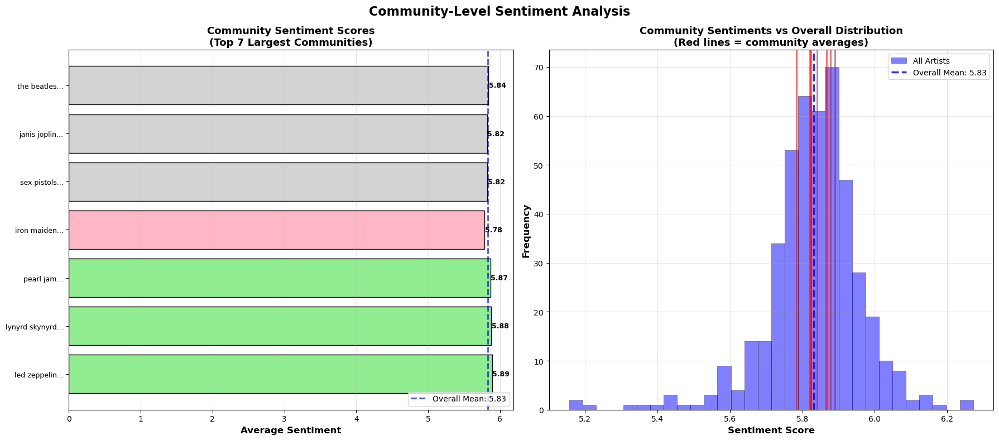

In [424]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 8))

# Left plot: Bar chart of community sentiments
comm_ids = []
comm_sentiments = []
comm_names_short = []

for comm_id in top_communities:
    if comm_id in community_sentiments:
        comm_ids.append(f"C{comm_id}")
        comm_sentiments.append(community_sentiments[comm_id]['avg_sentiment'])
        # Shorten name for display
        full_name = community_names[comm_id]['short_name']
        short_name = full_name.split(',')[0] + "..."  # Just first band + "..."
        comm_names_short.append(short_name)

# Color code bars
colors = []
for sent in comm_sentiments:
    if sent > sentiment_mean + 0.02:
        colors.append('#90EE90')  # Green for above average
    elif sent < sentiment_mean - 0.02:
        colors.append('#FFB6C6')  # Red for below average
    else:
        colors.append('#D3D3D3')  # Gray for near average

y_pos = range(len(comm_ids))
bars = ax1.barh(y_pos, comm_sentiments, color=colors, edgecolor='black', linewidth=1)
ax1.set_yticks(y_pos)
ax1.set_yticklabels(comm_names_short, fontsize=9)
ax1.invert_yaxis()
ax1.set_xlabel('Average Sentiment', fontsize=12, fontweight='bold')
ax1.set_title(f'Community Sentiment Scores\n(Top {len(top_communities)} Largest Communities)',
            fontsize=13, fontweight='bold')
ax1.axvline(sentiment_mean, color='blue', linestyle='--', linewidth=2,
            label=f'Overall Mean: {sentiment_mean:.2f}', alpha=0.7)
ax1.legend(loc='lower right', fontsize=10)
ax1.grid(axis='x', alpha=0.3)

# Add value labels
for i, (bar, sent) in enumerate(zip(bars, comm_sentiments)):
    ax1.text(sent + 0.005, i, f'{sent:.2f}', va='center', fontsize=9, fontweight='bold')

# Right plot: Distribution comparison
ax2.hist(all_sentiments, bins=30, alpha=0.5, color='blue', label='All Artists',
        edgecolor='black', linewidth=0.5)

# Overlay community average sentiments as vertical lines
for comm_id, sent in zip(comm_ids, comm_sentiments):
    ax2.axvline(sent, color='red', linestyle='-', linewidth=2, alpha=0.6)

ax2.axvline(sentiment_mean, color='blue', linestyle='--', linewidth=2.5,
            label=f'Overall Mean: {sentiment_mean:.2f}', alpha=0.8)
ax2.set_xlabel('Sentiment Score', fontsize=12, fontweight='bold')
ax2.set_ylabel('Frequency', fontsize=12, fontweight='bold')
ax2.set_title('Community Sentiments vs Overall Distribution\n(Red lines = community averages)',
            fontsize=13, fontweight='bold')
ax2.legend(fontsize=10)
ax2.grid(alpha=0.3)

plt.suptitle('Community-Level Sentiment Analysis', fontsize=16, fontweight='bold', y=0.98)
plt.tight_layout()
plt.show()

<center><sup>Figure: The left horizontal bar chart displays the average sentiment scores for the top communities. The blue dotted line represents tha overall mean of all the artist wiki pages sentiment scrore. While the right histogram shows the overall distribution of sentiment scores across all artists with red lines indicating the means of each community.</sup></center>

##### **Corresponding text from Week 8 Part 2 exercise:** #####

* **Do these results confirm what you can learn about each community by comparing to the genres, checking out the word-clouds for each community, and reading the wiki-pages?**
* **Compare the sentiment of the happiest and saddest communities to the overall (entire network) distribution of sentiment that you calculated in the previous exercise. Are the communities very differenct from the average? Or do you find the sentiment to be quite similar across all of the communities?**

Not at all, the sentiment analysis of every community are relatively uniform at around the mean with a very small deviation of $0.06$ point. Meaning that almost all the communities have a close to identical sentimental score. This means that it would be difficult to confirm what we learn about each communities from our previous analysis.

The happiest community, community 4 (led zeppelin, robert plant, roy orbison), has a sentimental score of $5.89$. While the saddest community, community 8, has a score of $5.78$. Only a $0.11$ difference in sentimental score, which doesn't really give us much information regarding the distinction between communities.

Now we will try to understand why this problem occurs. First of all, Wikipedia pages are written in formal tone and may not have a lot of words with strong sentimental values. In addition, we are analyzing artists pages, which are mostly factual information such as history, band members, achievements, etc. Therefore, a lot of the words used in these pages should be neutral or slightly positive in sentiment. This is also shown by the fact that the average sentiment score across all artists is $5.83$, taking into account that the LabMT happiness scores range from 1 to 9.

Another reason is because calculated the average sentiment score for each pages first and then we calculated the average sentiment score for each community. The first averaging step already showed that the sentiment scores across all artists are quite narrow distribution with a mean of $5.83$, minimum of $5.16$, maximum of $6.27$. Of course, averaging again for community sentiment analysus will just narrow the distribution even more. Resulting in a very uniform sentimental score across all communities.

One last reason is if we re-observe the wordclouds from Part 3, most of the top TF-IDF words are artist names. These words are not considered in the LabMT wordlist, therefore these unique characteristics of each community are not taken into account in the sentiment analysis.

## Notes on contributions

All team members solved the exercises independently. The assignment was partially solved together, where we crosschecked our solutions and adjusted our approaches.

We assigned each team member a section of the assignment, to put their solution into and format/describe it properly. In the end we had a session where each team member presented their solution, based on this we adjusted the end version together.

- Part 1 – Botond Rendes (s253343)
- Part 3 and Part 4 – Kyle Nathan Yahya (s252786)
- Part 2 – Denisa Babeii (s253528)


